In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [16]:
data = pd.read_json('Appliances.json', lines=True)

In [3]:
data.head()

,asin,image,overall,reviewText,reviewTime,reviewerID,reviewerName,style,summary,unixReviewTime,verified,vote
0,1118461304,NaN,5,Not one thing in this book seemed an obvious o...,"11 27, 2013",A3NHUQ33CFH3VM,Greeny,{'Format:': ' Hardcover'},Clear on what leads to innovation,1385510400,False,2
1,1118461304,NaN,5,I have enjoyed Dr. Alan Gregerman's weekly blo...,"11 1, 2013",A3SK6VNBQDNBJE,Leif C. Ulstrup,{'Format:': ' Kindle Edition'},Becoming more innovative by opening yourself t...,1383264000,False,NaN
2,1118461304,NaN,5,Alan Gregerman believes that innovation comes ...,"10 10, 2013",A3SOFHUR27FO3K,Harry Gilbert Miller III,{'Format:': ' Hardcover'},The World from Different Perspectives,1381363200,False,NaN
3,1118461304,NaN,5,"Alan Gregerman is a smart, funny, entertaining...","10 9, 2013",A1HOG1PYCAE157,Rebecca Ripley,{'Format:': ' Hardcover'},Strangers are Your New Best Friends,1381276800,False,NaN
4,1118461304,NaN,5,"As I began to read this book, I was again remi...","09 7, 2013",A26JGAM6GZMM4V,Robert Morris,{'Format:': ' Hardcover'},"How and why it is imperative to engage, learn ...",1378512000,False,10


In [3]:
from collections import Counter
Counter(data.overall)

Counter({5: 416288, 4: 75476, 3: 30652, 1: 59627, 2: 20734})

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 602777 entries, 0 to 602776
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         602777 non-null  int64 
 1   vote            65262 non-null   object
 2   verified        602777 non-null  bool  
 3   reviewTime      602777 non-null  object
 4   reviewerID      602777 non-null  object
 5   asin            602777 non-null  object
 6   style           137973 non-null  object
 7   reviewerName    602762 non-null  object
 8   reviewText      602453 non-null  object
 9   summary         602649 non-null  object
 10  unixReviewTime  602777 non-null  int64 
 11  image           9258 non-null    object
dtypes: bool(1), int64(2), object(9)
memory usage: 51.2+ MB


In [9]:
data.reviewText[0]

"Not one thing in this book seemed an obvious original thought. However, the clarity with which this author explains how innovation happens is remarkable.\n\nAlan Gregerman discusses the meaning of human interactions and the kinds of situations that tend to inspire original and/or clear thinking that leads to innovation. These things include how people communicate in certain situations such as when they are outside of their normal patterns.\n\nGregerman identifies the ingredients that make innovation more likely. This includes people being compelled to interact when they normally wouldn't, leading to serendipity. Sometimes the phenomenon will occur through collaboration, and sometimes by chance such as when an individual is away from home on travel.\n\nI recommend this book for its common sense, its truth and the apparent mastery of the subject by the author."

In [4]:
from nltk.corpus import stopwords
stops = set(stopwords.words("english")) 
from nltk.stem import PorterStemmer
stemming = PorterStemmer()
def preprocessor(line):
    line = line.lower()
    line = line.split()
    #print(line)
    line = [stemming.stem(i) for i in line]
    #print(line)
    line = [i for i in line if not i in stops]
    #print(line)
    return ' '.join(line)

In [5]:
def preprocessor_nostem(line):
    line = line.lower()
    line = line.split()
    #print(line)
    line = [i for i in line if not i in stops]
    #print(line)
    return ' '.join(line)

In [6]:
data.reviewText = [preprocessor_nostem(str(i)) for i in data.reviewText]

In [7]:
data.reviewText[0]

"one thing book seemed obvious original thought. however, clarity author explains innovation happens remarkable. alan gregerman discusses meaning human interactions kinds situations tend inspire original and/or clear thinking leads innovation. things include people communicate certain situations outside normal patterns. gregerman identifies ingredients make innovation likely. includes people compelled interact normally wouldn't, leading serendipity. sometimes phenomenon occur collaboration, sometimes chance individual away home travel. recommend book common sense, truth apparent mastery subject author."

In [14]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

In [15]:
data['scores'] = data['reviewText'].apply(lambda review: sid.polarity_scores(review))
data['compound']  = data['scores'].apply(lambda score_dict: score_dict['compound'])
data['comp_score'] = data['compound'].apply(lambda c: 1 if c >=0 else -1)

In [17]:
from collections import Counter
Counter(data.comp_score)

Counter({1: 540926, -1: 61851})

In [15]:
data[data['asin']=='1118461304'].overall.mean()

4.6

In [29]:
df = pd.read_json('Appliances.json', lines=True)

In [8]:
from collections import Counter
import re
from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS

def clean_word(word):
    return re.sub(r'[^\w\s]','',word).lower()
def word_not_in_stopwords(word):
    return word not in ENGLISH_STOP_WORDS and word and word.isalpha()

def mapper(text):
    tokens_in_text = text.split()
    tokens_in_text = map(clean_word, tokens_in_text)
    tokens_in_text = filter(word_not_in_stopwords, tokens_in_text)
    return Counter(tokens_in_text)
def reducer(cnt1, cnt2):
    cnt1.update(cnt2)
    return cnt1
def chunk_mapper(chunk):
    mapped = map(mapper, chunk)
    reduced = reduce(reducer, mapped)
    return reduced

In [9]:
def chunks(l, chunk_size):
    result = []
    chunk = []
    for item in l:
        chunk.append(item)
        if len(chunk) == chunk_size:
            result.append(chunk)
            chunk = []
    return result

In [10]:
%time data_chunks = chunks(data.reviewText, chunk_size=150613)

CPU times: user 140 ms, sys: 4.02 ms, total: 144 ms
Wall time: 143 ms


In [11]:
import multiprocessing as mp
from datetime import datetime
from functools import reduce

def main():
	pool = mp.Pool(4)
	start = datetime.now()
	mapped = pool.map(chunk_mapper, data_chunks)
	reduced = reduce(reducer, mapped)
	end = datetime.now()
	t = end-start
	print(start, end)
	print(t.seconds)
	print(reduced.most_common(10))

# DO NOT REMOVE main function construct it is required for multiprocessing
if __name__ == "__main__":
	main()

2020-05-20 23:31:55.159925 2020-05-20 23:32:08.202864
13
[('great', 140745), ('works', 101881), ('water', 99436), ('fit', 86763), ('filter', 84078), ('good', 83288), ('product', 78151), ('easy', 68074), ('like', 66334), ('price', 65446)]


In [12]:
meta = pd.read_json('meta_Appliances.json', lines=True)

In [27]:
meta.also_buy.fillna(value='NaN')

0        [0307888908, 038534936X, 1250141222, 184794080...
1        [1906487316, 1906487014, 1906487006, 190648705...
2                                                      NaN
3                                                      NaN
4                                                      NaN
5                                                      NaN
6                                                      NaN
7                                                      NaN
8        [B000BPFZHM, B000FP8LK6, B07D5RQ5YL, B00002N7I...
9        [B000FK9X6W, B000BPFZHM, B000FP8LK6, B00002N7H...
10                                                     NaN
11                                                     NaN
12                                                     NaN
13                                                     NaN
14                                                     NaN
15                                                     NaN
16                                                     N

In [34]:
empty = set()
for i in range(len(meta.also_buy)):
    if type(meta.also_buy[i]) != type(list()):
        empty.add(i)

In [36]:
empty

{2,
 3,
 4,
 5,
 6,
 7,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 19,
 22,
 23,
 24,
 26,
 28,
 29,
 31,
 33,
 35,
 38,
 39,
 40,
 42,
 46,
 47,
 48,
 49,
 52,
 53,
 54,
 55,
 59,
 61,
 62,
 63,
 66,
 67,
 68,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 79,
 80,
 81,
 82,
 84,
 85,
 87,
 88,
 89,
 90,
 91,
 92,
 94,
 95,
 96,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 143,
 144,
 145,
 148,
 151,
 153,
 154,
 155,
 158,
 159,
 161,
 163,
 164,
 167,
 169,
 170,
 173,
 175,
 179,
 180,
 181,
 182,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 200,
 201,
 203,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 225,
 228,
 229,
 230,
 232,
 234,
 235,
 237,
 239,
 241,
 244,
 245,
 246,
 248,
 252,
 253,


In [39]:
Counter(data.overall)

Counter({5: 416288, 4: 75476, 3: 30652, 1: 59627, 2: 20734})

In [43]:
!pip install wordcloud

    100% |████████████████████████████████| 368kB 172kB/s ta 0:00:01


In [41]:
content = ' '.join(data.reviewText[:2000])

In [42]:
from wordcloud import WordCloud
wordcloud = WordCloud(background_color="white").generate(content)

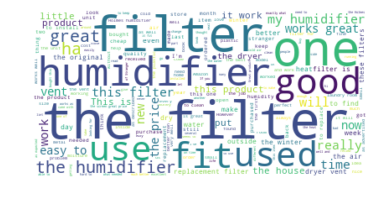

In [43]:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [49]:
content

'one thing book seemed obvious original thought. however, clarity author explains innovation happens remarkable. alan gregerman discusses meaning human interactions kinds situations tend inspire original and/or clear thinking leads innovation. things include people communicate certain situations outside normal patterns. gregerman identifies ingredients make innovation likely. includes people compelled interact normally wouldn\'t, leading serendipity. sometimes phenomenon occur collaboration, sometimes chance individual away home travel. recommend book common sense, truth apparent mastery subject author. enjoyed dr. alan gregerman\'s weekly blog ([...] two previous books since taking innovation class alan decade ago. opened eyes seeing world fresh way also taught structured techniques use increase creative problem solving skills teams individuals. alan untangles difference invention innovation makes much easier see 99%+ innovation adaption proven inventions borrowed industries, discipli

In [2]:
df = pd.read_json("meta_Appliances.json", lines=True)

In [3]:
df.columns

Index(['also_buy', 'also_view', 'asin', 'brand', 'category', 'date',
       'description', 'details', 'feature', 'image', 'main_cat', 'price',
       'rank', 'similar_item', 'tech1', 'tech2', 'title'],
      dtype='object')

In [15]:
df

1118461304 ['0307888908', '038534936X', '1250141222', '1847940803', '0007592515', '0374273537', '0874776317', '089862486X', '0553345729', '0684855275', '1501127624', '0385480016', '0393700046', '1592578659', '0393702634', '1402244843', '0190457325', '161039786X', '0465044301', '1572301511', '0393703835', '1412914035', '0495597244', '0393306321', '0875895956', '1572309601']
1118461304 ['1906487316', '1906487014', '1906487006', '1906487057', '1906487278', '1906487022', '190648726X', '1906487243', '1906487235', '1906487251', '1906487154', '1906487146', '1906487286', '1906487111', '1906487138', '1906487030']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B000BPFZHM', 'B000FP8LK6', 'B07D5RQ5YL', 'B00002N7IL', 'B000FPDO4Y', 'B00004YUMZ', 'B000MIAMDK', 'B003AU6NDU', 'B000FK9X6W', 'B00002N5HJ', 'B00002N5IP', 'B003X57WBE', 'B075NW6HC6', 'B000VL6X22', 'B000BPBVZ2', 'B000U39Y3G', 'B00002N5HK', 'B00192QB9M', 'B00NPZH820', 'B001FD3L1G', 'B000P

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00NTOBOCM', 'B00P37TXKS']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B016M169KU', 'B003B6JC40', 'B000I19AIE', 'B008E5CQQ4', 'B00YI7T9UI', 'B000I1ARN6', 'B0769LLRDV', 'B000K6QFSU', 'B007PT0YXW', 'B00835ESMU', 'B00TUR5EM8', 'B005QC1FC4', 'B000E77I0Y', 'B00ITPJK40', 'B002RN3HNK', 'B000KDZVRO', 'B00MA9GFSA', 'B00ITPEQIU', 'B00GZ

1118461304 nan
1118461304 ['B00DM8LZAQ']
1118461304 ['B0797FJX2C', 'B01AVSIFY8', 'B00RKKAUK8', 'B01ARKUXOU', 'B001IDKY5Y', 'B00FIYOK0Y', 'B00FIYQD7C', 'B001HPAL9W', 'B00CDQZWKM', 'B001ICYB2M']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00AFSMJ5Q', 'B00AFSMIOS']
1118461304 ['B07DMF7722', 'B00LQDB202']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00DZUB3ZI', 'B00ECV5I2I']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B072Z8DQ3M', 'B00I1IDCEO', 'B00P9C66PM', 'B00FE6LQRG', 'B075M483PH', 'B00DZU80E0', 'B077SZ71KQ', 'B07449T6WQ', 'B00M9IBL3G', 'B01IVBZHYI', 'B00ECV42H0', 'B01M4O04V5', 'B00DM8JSDC', 'B008YDS7WS', 'B00JCY5KC8', 

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00545B67M', 'B00E0CVMDI', 'B073NB5NNT', 'B00545AV9Q']
1118461304 nan
1118461304 nan
1118461304 ['B00LOX044O', 'B00VO06ZKO', 'B016WXA8MI', 'B00DZUBORA', 'B0751SCQWC', 'B001DHGDTG', 'B00DZUA1GU', 'B01H1VM41S', 'B0156NCPZ8', 'B0178GIJ56', 'B003EAJSY2', 'B0779XMGWX']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B0156N92NG']
1118461304 ['B00M25BZCS']
1118461304 nan
1118461304 ['B006EAKNFW', 'B00LHR1PV8', 'B00M4JCJD6', 'B00DZU8X6U', 'B00EKZHQ4O', 'B001DVUOYC', 'B002ZNC68Y', 'B00ECV42FW']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
111846

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B005B9EQ1O', 'B00DM8LUBK', 'B00DZUBQKA', 'B005B9EG1Y', 'B00ECV3RH6']
1118461304 ['B00LGUD9WY', 'B001DPOFKM', 'B0021F1MW2', 'B01BTEWXG4', 'B00DM8L5GU', 'B000HBIBOY', 'B077VX8ZY3', 'B071DNC3B9', 'B000H5Y6CQ', 'B072YQNJCR', 'B00LGUDCQ2']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B07H47Q8BC', 'B00A8O063O', 'B00A8O04VI', 'B00MOCKG10', 'B001TH7GZU', 'B008HGBPIU']
1118461304 nan
1118461304 ['B00MNMQZ7A']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00E0CVVS4', 'B00GSRFMS4', 'B005B9E95M', 'B01F2W0GQI', 'B07C34LJDC', 'B00W0YO9GK', 'B005B9CHL0', 'B01CC87G86', 'B016YJ4TRU', 'B01G4WLQ4G', 'B07924D9P7', 'B00LQDAGAY', 'B00UREYUDC', 'B005B9C97M', 'B004KSIR8U', 'B00W0YOSIE', 'B01GE2Q06A', 'B00JGU37BE', 'B00JGU5KKU', 'B0156NIUA2', 'B01N26I0QJ', 'B015L18Z4K', 'B00CD6KQUS', 'B00N3FB2VK', 'B00FKIOTTA', 'B00LXAOM2I', 'B00LQDJQGE', 

1118461304 nan
1118461304 nan
1118461304 ['B00OMQZU6M', 'B004W6IL04', 'B075M2Q4B2', 'B00LQL043A', 'B003BIGDIG', 'B003BIGDMC', 'B003BIGDKO', 'B004H3XWDI', 'B077BLBH2V', 'B004H3XWVU', 'B00CW0O1EW', 'B00LQDJQGE', 'B00LQDI048', 'B01DJFFT62', 'B003BIGDLI']
1118461304 ['B01GRYH3E8']
1118461304 ['B004H3XWPG', 'B0156NI3BI', 'B00MOCT3C8', 'B00A8O05M6', 'B004H3XWCO', 'B000AST3AK', 'B00MOCT38W', 'B00DM8LECK', 'B00Y1XG4LG']
1118461304 ['B00MOCUF6Q']
1118461304 nan
1118461304 ['B00DM8JGQQ', 'B00DZUAREQ', 'B00DM8JHTM', 'B008YDT2MC', 'B072YWVRZR', 'B00DM8LH1S', 'B00DM8JOVS', 'B00DZUAH28', 'B00ECV3SFC', 'B00DM8LIIA', 'B072VL5H78', 'B00JCY5KC8', 'B077BLBH2V', 'B004XLDE5A', 'B00DM8K1R4', 'B00DM8J6RU', 'B01FSR3X7Q', 'B01GVPL5Q0', 'B00GVL0U7K', 'B00LGUFNDM', 'B00DM8JD4Q', 'B00CW0O1EW', 'B00DM8L5GU', 'B00FPYFS9Y', 'B001TIWG04', 'B00DM8L7DQ', 'B01MTZXWF4', 'B00DM8LL1O', 'B00LQDAYZ6', 'B008DJIAMA', 'B00MGMY95M', 'B0056I99WG', 'B072W149XT', 'B00DM8M1LI', 'B00DZUBQKA', 'B0087Q08Z6', 'B008YDSFR0', 'B01N4P324S',

1118461304 ['B0074WGGZU']
1118461304 nan
1118461304 ['B008RPHL3Y', 'B0189H5QIQ', 'B078GZ96N4', 'B079TZDM33', 'B079KCSZDP', 'B07CM56ZT8', 'B07DRBBMKL', 'B07K9JMRTT', 'B00H2XMP8I', 'B00UVHTGJ8', 'B017KERLEG', 'B00KNQRLFS', 'B00HDSX41E', 'B00HWS6KKM']
1118461304 ['B0025YP3HO', 'B00LQDGMKC', 'B003WKNR2S', 'B002J3DRA6', 'B002ZD6OAA', 'B000OV8XAE', 'B00A16SX4S', 'B000Q5SUZG', 'B00A16SW0S', 'B007Z1KJT4', 'B00TMIKEBG', 'B007J0IMUY', '1455914746', 'B0056JVM98', 'B0774CWLWD', 'B003BNZ4YK', 'B00WXLQBYS', 'B001DPRXCO']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B0002TSA8S', 'B000AO1G72', 'B000CMHLMG', 'B000VBLBUG', 'B000E1385Y', 'B01J664VSA', 'B079T4XXQY', 'B00MFBUBW4', 'B0175Y17SW', 'B00IFAPYBM', 'B000CMFKOC', 'B0000DK356', 'B0026SZF4A', 'B015WYAQLQ', 'B015968AWO', 'B004EZT38M', 'B000VGX4TM', 'B01CEQN00E', 'B01DJV1ZBO', 'B00006IV17', 'B01BMTOHUG', 'B018I2ND00', 'B00007E7RQ', 'B075S2GSX5', 'B016QSB4UO', 'B00FX9OHMK', 'B07FYBZ5Y7', 'B01M1N7WYN', 'B07GXBT

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00DH21WN2', 'B0041SXMUM', 'B00I1IDCEO']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B005B9CI96', 'B00QZPA8HE', 'B00754RQZ6', 'B00CW0O1EW', 'B01BGMU3TI', 'B00E0CW9MG', 'B0050KKS5C', 'B00HNEJHSM', 'B00DM8KAHU', 'B00JCY5KC8', 'B01LX8RI1V', 'B00E0CWKMK', 'B0041SXMUM', 'B01BGMU48S', 'B00A8O0710', 'B00P9C66PM', 'B0056I99WG', 'B001DPQN70', 'B00LQDJQGE', 'B072MYV8B7', 'B008YDSFR0', 'B01M4NZM9D', 'B077BLBH2V', 'B005BA3O6Q', 'B004YTH04W', 'B06XBWDVR2', 'B005WV60CE', 'B006ZZU55Y', 'B004FO8JZ0', 'B00LQDAYZ6', 'B00THPT7R6', 'B00DNCJNFA', 'B073LYD17G', 'B01BGMU5HS', 'B01KBUOCKW', 'B01LY2OOCX', 'B017G9SD3I', 'B005459KTI', 'B01MR3232E', 'B008YDT9RK', 'B00AUDAEMQ', 'B0189H5EHE', 'B0791N755P', 'B01GXOY74Q', 'B008HG44T2', 'B07B9T4GWQ', 'B00DM8JA8A', 'B0002UPGOI', 'B07CWG3T5Y', 'B00FPYFS9Y', 'B00DM8J3VY', 'B075286FC

1118461304 ['B01D636BIM', 'B01D6360NS', 'B016OX0HYU', 'B019NFS342', 'B01MT33ZF5', 'B00F0U9P7O', 'B0716D6BNC', 'B06XHHR98K', 'B01N6RR1HY', 'B01D3PGUTI', 'B000HE6EOA']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B01EXQWHXO', 'B01LYVSB3O']
1118461304 nan
1118461304 nan
1118461304 ['B0076OW80S', 'B00VTQFX2Y', 'B0015S4KIO', 'B0076OW93Y', 'B00IK2OW68', 'B00UOXMCAO', 'B01N4C3RN6', 'B00RYWDXRO', 'B002VNEZX2', 'B00CX9C15S', 'B00ZAAXLHY', 'B007KDZ6WC', 'B00DJVIU18', 'B00IK2OVDC', 'B00IK2OB28', 'B00HPNFD5C']
1118461304 nan
1118461304 ['B009B1PA90', 'B008GPRX0Q', 'B0086CXRC2', 'B009D5YCJS', 'B009DUMT7A', 'B0086CZKUY', 'B009D668KS', 'B06XG8GLB1', 'B008H7UZLC', 'B013XHGCNA', 'B01M3U5G9C', 'B00425FUW2', 'B00EDTG3VE', 'B0195UVWJ8', 'B014OIP9JK']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B01M00RMZ8']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00N2EUPUG', 'B00COD8KJY', 'B00CD23PBE', 'B01N1LZQA8']
11

1118461304 nan
1118461304 ['B005B4B5FY', 'B003BIGCZU', 'B004H3XSYG', 'B00A8O07I8', 'B00OMR0B74', 'B0747ZYS7R', 'B00DZU897S', 'B00DZUANTU', 'B017TJ59CI', 'B00M0YPS3I', 'B0773H83W1', 'B00K8HZI5W', 'B00LQKZZU8', 'B003BIGDQI', 'B075NNSD4B', 'B00OMR0RJQ', 'B004H3XSR8', 'B00JQYGL2W', 'B00DMUO1E6', 'B004H3XT0Y', 'B0721DBYF9', 'B01BHIFAJY', 'B00DM8J59O', 'B075Y5PPPM', 'B07D9TMFMH', 'B00A8O047W', 'B00LHR6C2K', 'B00PKI77GC', 'B00A8O0FGC', 'B07D3G8R2Y', 'B00GMIOXRK', 'B00OMR12UY', 'B00HNEJ0Q6', 'B00DM8JL4I', 'B07D36VQ43', 'B00CW0O1EW', 'B01MF9YMYQ', 'B00LHRAGM2', 'B00JCY5KC8', 'B0081EAC0U', 'B015YXF8HW', 'B00HG01YCA', 'B00ECX038A', 'B01KR7Y8NK', 'B0189H5EHE', 'B004XLEJ7M', 'B00LHRAGHW', 'B00DM8JUIU', 'B00OL1CIOA', 'B07BVKKQVP', 'B00ECV5EQI', 'B00JFG6YOG', 'B003BIGD1S', 'B073K3Y35V', 'B07C1BVGLL', 'B00UWD6WPC', 'B00M0YP1PS']
1118461304 nan
1118461304 ['B00ECX09KC', 'B07929WNF7', 'B00SPYDSFC']
1118461304 ['B008YDSI04', 'B008YDSKL6', 'B00EKZGKGO', 'B06XPX6G59', 'B00L4GGDRS', 'B00A8O0E72']
1118461304

1118461304 nan
1118461304 ['B00ENLEHSI', 'B00EMZ697C', 'B00HNQC6Z6', 'B00EMZC9YE', 'B00HNQCC3W', 'B00ENL4NX2', 'B00HNQC93U', 'B00HNQC6XS', 'B07585CDFT', 'B00EMQ92HU', 'B010ONX5W2', 'B00ENLJ8KA', 'B01LWIX13S', 'B00EMZ9KQO', 'B00EN8RHOC', 'B00316SK8E', 'B00G2DL8M8', 'B00EMZBQJ8', 'B00ELIJDGO', 'B009EC7SAA', 'B00B650RWO', 'B00HNQC908', 'B00ENL4S2S', 'B00ENLF19C', 'B009EC4A5G', 'B00ELIMOI8', 'B017HL8L9Q', 'B00EZH4TGK', 'B00ELIAO3U', 'B00EMZBQPW', 'B01INT0WUC', 'B017WYZUYM', 'B00EN8P1TK', 'B00HNQ8XLC', 'B0036BGLZI', 'B00KNQGX02', 'B0055YDRL0', 'B00EN9X7FY', 'B00ENXDYDK', 'B00MPQU04S', 'B00HNQC2GY', 'B013XTJXNY', 'B00EMQMBEG', 'B0160LIIO2', 'B00EMQK5O4']
1118461304 ['B00EN8RHOC', 'B00EMZ9KQO', 'B00HNQBJLS', 'B00IKYJU7W', 'B078H9Z1S5', 'B00HNQDQXC', 'B00EMQMBEG', 'B00ENLL1T6']
1118461304 ['B00EMIL8Q6', 'B00EMINMMY', 'B017KERLEG', 'B00HNQBVMK', 'B00EN8KS7A', 'B00KNQXK1C', 'B079V2BBHR']
1118461304 nan
1118461304 ['B00EN8IUJ8', 'B00EN8GK5E', 'B00HNQAD2E', 'B00MPR7J64', 'B00EN8I930', 'B00EN9X2HM'

1118461304 nan
1118461304 ['B00RYWES9Q']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00E0CW3HC', 'B00DM8LBCI', 'B00E0CW9GW', 'B00DM8LE8E', 'B001DPLYME']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00M3BQZWQ', 'B0053F9LCK', 'B075XMZFRL', 'B0053F8D1U', 'B0792426DD', 'B00GVL0U7K', 'B008YDSLTW', 'B00CW0O1EW', 'B018RHYHR4', 'B00DM8L056', 'B00AYBLXCO', 'B0041SXMUM', 'B00DM8JBZW', 'B0156NE3G2', 'B00ULLTQH6', 'B004XLDFKO', 'B00OQHK5KI']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00EMPU5XG']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B003B3JBJY', 'B0093R66BI', 'B0093R5S4Y', 'B00NAOWOXO', 'B00MOCFU1G', 'B00MOCFEWQ', 'B01MFDW0V8', 'B00MNMWH9K', 'B00DZU99TK', 'B00MOCGW7W', 'B006H7EFZ6']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan


1118461304 nan
1118461304 ['B00VBP8QPO', 'B00UXG4WR8', 'B07DWB27HF', 'B004DNWVPM', 'B007X0ILXS', 'B007MEY22O', 'B00MAOSML8', 'B01AXCS7HC', 'B07D74N7V6', 'B07BNKLQ7D', 'B076PSBJX7', 'B00C91Q86I', 'B0014XPKPM', 'B0014XPNVI', 'B00L9GB54O', 'B07BJCQY19', 'B00KLAXNJE', 'B01LF4D3OE', 'B00PI2TVUA', 'B071GPKB32', 'B00DYIYMZO', 'B002R0DXQE', 'B000PKZG22', 'B00SWV118E', 'B06XPX8HCH', 'B00UB441HS', 'B06WRPGVS7', 'B07CS2KNVX', 'B0014XNS5G']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00LQDAGB8', 'B0063C1N6Y', 'B0041SXMUM', 'B01LXNF0OI', 'B015OSFJNA', 'B00VC55Y08', 'B005BA3O6Q', 'B008DJL09A', 'B00M25QM80', 'B00CW0O1EW', 'B00EO74F3S', 'B06XKB5FSL', 'B016YJ4TRU', 'B00SPYDSFC', 'B072YSVRLB', 'B003BIGDLI', 'B00D6MDETI']
1118461304 ['B00AFSMXZW', 'B00AF7UICS', 'B00AYBLLKS', 'B00AUDAG2O', 'B00AH5ZKH6', 'B00UCARK7E', 'B00AUDA8DQ', 'B0032AMC6K', 'B00AH60OTY', 'B00AF7SLFE', 'B00AYBLLRG', 'B00M25QBRC', 'B00CW0O1EW', 'B0

1118461304 nan
1118461304 ['B0053F7MP8', 'B00LQDE6EG', 'B00J7D3DHS', 'B07H97B3G3', 'B07BN6PQ9X', 'B00DM8LUBK', 'B07H491F3Y', 'B00M0YMPGQ', 'B07926DPVV', 'B072W149XT', 'B0029L37DA', 'B00QXT9O1S', 'B005B9EG1Y', 'B075DZ9VXH', 'B01BGMU3PC', 'B00J7DAK6A', 'B07CBLPC2H', 'B00M259TUI', 'B07924D9P7', 'B00DM8JVR0', 'B00LQDCSOQ', 'B0056IA4HA', 'B07DNBZHRT', 'B07CWG3T5Y', 'B00DM8L682', 'B01LX8RI1V', 'B00DM8LE8E', 'B00LLLRTA6', 'B077BLBH2V', 'B00LQDGIUG', 'B00DM8MALY', 'B00R3MGOSU', 'B00PU1Y22Q', 'B00AYBKHVW', 'B00MGMY95M', 'B07B4MD7VY', 'B01N5LMI4L', 'B00545AFOC', 'B0053F89M8', 'B0041SXMUM', 'B075286FCQ', 'B001ICYB2M', 'B00M106JRA', 'B00C7PUTKM', 'B016YJ4TRU', 'B01KKDBDZM', 'B00LHR6NOM', 'B0189H5EHE', 'B07927P2X3', 'B00LQDJQGE', 'B013P3Y7IO', 'B075XMZFRL', 'B00DM8KTH6', 'B00T89KGHG', 'B001DPQN70', 'B00LQDE6J6', 'B01M4NZM9D', 'B0053F7UIM', 'B00DM8J3MI', 'B01MQM4XL9', 'B005B9DP4I', 'B00CW0O1EW', 'B00DM8L8DK', 'B0050O2BHQ', 'B002DUCEMW', 'B00U32ZZ2S', 'B00AYBLXCO', 'B00M25QM80', 'B00ECV5FP8', 'B00E0C

1118461304 nan
1118461304 nan
1118461304 ['B005IG6VWW']
1118461304 nan
1118461304 nan
1118461304 ['B00EN8R65C', 'B00EMJOZJW', 'B00EN8PJN8', 'B00MPR7J64', 'B00HNQASIS', 'B00EN8NV60', 'B07HC6L93N', 'B00MPR7JBE', 'B06XRJ32LD', 'B00LF12NTO', 'B00ENLE6HU', 'B00EMJR03K', 'B00EMK0SL0', 'B00HNQATKA', 'B00CW2RB3I', 'B01HWV9W7G', 'B018594HV0', 'B0045LQD6U', 'B00N992JWQ', 'B00MPR9HZA', 'B00EN8PJQK', 'B00HNQAD2E', 'B00W3HVIWW', 'B00ELIJDGO', 'B01871MKSS', 'B01FNS21JG', 'B000VYHYFY', 'B00EN8P2US', 'B00VV5DJFQ', 'B00W3HVIZ4', 'B00EN8QRC0', 'B00HNQASJC', 'B018A3CW22', 'B07D9BNHB2', 'B012HD7BUE', 'B00EMZ9KQO', 'B00EN9WBVU', 'B00EN8GK5E', 'B003U4N7AI', 'B003AT72IG', 'B00FRZP0YO', 'B00VV5D23U', 'B003RXS8OC', 'B004PUHS1K', 'B00JK2PKJA', 'B00W3HVIVI', 'B00PA3XEA0', 'B00EN9VN82', 'B00MAQB9K2', 'B005VTSLNS', 'B00EM5YQWM', 'B00ENL5QRE', 'B0055ZETRK', 'B00HNQBVQ6', 'B00KNQRZEU', 'B00DM8J3MI', 'B0725W39QN', 'B003KIPSK6', 'B00CW2SBPU', 'B072HVMYZC', 'B00MAOH8C2', 'B00LCAU2LE', 'B000NPPBD8', 'B00EN8K1ZE', 'B00EM

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00C29FTT4', 'B00NAOQ034']
1118461304 ['B01M5I543B', 'B00EDNRC0G', 'B00AMF7X3A', 'B07CWG3T5Y', 'B01N9CUPF6', 'B01GXOXYRM', 'B00CW0O1EW', 'B0056I99WG', 'B013P3Y7IO', 'B009AXF41S', 'B001DHLGOS', 'B00DSUPOE6', 'B01KKDBDZM', 'B0041SXMUM', 'B006ZZU55Y', 'B01FSR3X7Q', 'B07B4N2YT3', 'B00E0CWPZ2', 'B01GC435F4', 'B00AH5ZOI6', 'B07B41KT8S', 'B00AUDAEMQ', 'B00SPYDSFC']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00AF7TSZQ', 'B00T89MZ84', 'B00AYBL0MW', 'B00C29FTT4', 'B00NAOPU8A', 'B07CYLK6JW', 'B00OMQZU6M', 'B00FAV3DW6', 'B00IEDHJFE', 'B00YGL5J7S', 'B00AYBL4V4', 'B00IIHGD44', 'B00O2CF24Q', 'B00O9700PU', 'B06Y3BT368']
1118461304 nan
1118461304 nan
1118461304 ['B000CCINKK', 'B01BRJ1HJA', 'B004DNWVMA', 'B00UH2OIMC', 'B00NMLG2EM', 'B00ECV5J22']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00A8O0DNM']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 [

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B01GL3MSIQ', 'B000DZGN7Q']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00M0YYBTU', 'B00AUDA3DG', 'B00AYBL0IG', 'B00FAV39RA', 'B00VMGSXXW', 'B07BZHH6XW', 'B00W4YE7M2', 'B075X3JT6X', 'B00AH5ZPVW', 'B00AUDA44E', 'B00M0YXWK4', 'B00M0YXT0W', 'B00AYBL3II']
1118461304 ['B001HP6L46', 'B001ICYB2M', 'B075DX5VQ7', 'B00BL4E3NY', 'B077BG6KCQ', 'B004X4PSME', 'B00VTZQD56', 'B00OS24EAI', 'B01GC1087U', 'B01N5LMI4L', 'B001KGX5G4', 'B01KIU2L9Y', 'B06Y51DRPR', 'B071D1RP5W', 'B005BQS1ZO', 'B01FSR3X7Q', 'B00T89CAN4', 'B01H4S4QZ0', 'B075F1SLV3', 'B07BTZFTLN', 'B00BL4K69O', 'B01KKDBDZM', 'B07B4MZQHM', 'B07B9T2TWZ', 'B0775Z6W4X', 'B074W25BYT', 'B074V4VNLD', 'B07C9X81NZ', 'B07DQFHTVS', 'B077BSPDRW', 'B07BXDBPQG', 'B01MQHA8Z3', 'B00CW0O1EW', 'B00VAOP3DE', 'B078BKYJF1', 'B01LXNF0OI', 'B075F1YVYS', 'B01M4NZM9D', 'B00MGMXXAY', 'B00LQDAYZ6', 'B0797FJX2C', 'B077QXFLY1', 'B07FLPZ8GW', 'B00VIYJ8Y6', 'B0

1118461304 ['B00ECX038A', 'B078NPSQZV', 'B07CHDB7WT', 'B01N32JXJ0', 'B0768DP253', 'B07C82LNGZ', 'B00LQKZZU8', 'B07CP45JHT', 'B07GB589L5', 'B07BJCW9CF', 'B00LLLXOXW', 'B07GVSDLW7', 'B078XT2S16', 'B01NBTCWA8', 'B07D3R9GB1', 'B01J7UGX1S', 'B00K8HZI5W', 'B004H3XSYG', 'B0195UHYT0', 'B07C461VJG', 'B07FT2S9CQ', 'B0747ZYS7R', 'B018MPHZL6', 'B07D2BDCKJ', 'B075Y5PPPM', 'B072ZBF2RH', 'B005AR7WZY', 'B076D16694', 'B0773H83W1', 'B00DM8KORQ', 'B0049HE6AU', 'B00CW0O1EW', 'B004XLDE5A', 'B07BVKKQVP', 'B00Y1RZKTY', 'B00JFG6YOG', 'B00MNMXSHA', 'B00E0CWKMK', 'B07B41KT8S', 'B00EXRILE8', 'B06XFRRLQV']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00AUDA3R2', 'B00AUDA44Y', 'B00M0YYBTU', 'B00AUDA3D6', 'B00FAV39RA', 'B00AYBL0IG', 'B01KKDBDZM', 'B01LXNF0OI', 'B00W4YE7M2', 'B07GWLNQZV', 'B00LQDASRK', 'B00LQDJQGE', 'B01FSR3X7Q', 'B00AYBM0F8', 'B01N0BBP3T', 'B00CW0O1EW', 'B01GXOY74Q', 'B00AYBKJFG', 'B00M25QM80', 'B00BL4K69O', 'B005BQS1ZO', 'B07CWG3T5Y', 'B078BSCFQD', 'B07DQFHTVS', 'B0170EPPO4', 'B01GC1

1118461304 nan
1118461304 nan
1118461304 ['B00NAP2F4Q']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00ZQ1GNJ0', 'B004WRE9YU', 'B01J0I0TQM', 'B003N1ZSYG', 'B00V9GYVA4', 'B00CD6JOJC']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00CDQZWKM', 'B01AVSIFY8', 'B002Z8ISKO', 'B07FW7TTRK', 'B00QZPP158', 'B00ZPLPTZA', 'B001HPAL9W', 'B00FIYQD7C', 'B073XSZ42J', 'B003QIFBES', 'B00RKKAUK8']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00ZPTXIZK', 'B00CD6JO0Q', 'B00FIYOJV4', 'B00YD2HB9Y', 'B078W3Y3CJ', 'B01J0I0TQM', 'B004WRE9YU', 'B003N1ZSYG', 'B078WL6VFS', 'B001HT67AA', 'B00HT39JM6', 'B06XJN8HH7', 'B01G4Z2C50', 'B01BTL1SAE']
1118461304 ['B07CWCYC1W', 'B018FCO514', 'B00LQDJQGE', 'B078ZFDK6R', 'B07CWG3T5Y', 'B005BNN1AC', 'B077BLBH2V', 'B01FSR3X7Q', 'B07CVNNPQT', 'B00BL4K69O', 'B01LXNF0OI', 'B001BA1HH8', 'B00JCY5KC8', 'B01M4NZM9D', 'B077BG6KCQ', 'B01G91Y4VE', 'B00M25QM80', 'B009AXE36K', 'B00AYBKJFG', 'B0053F80JA', 'B00ZFS3OQ4', 'B0

1118461304 ['B00DZU9D1E', 'B004XLE2A6', 'B001SKXZNA', 'B003UEH7CC', 'B000EVYGZA', 'B00UXG4WR8', 'B00UB38V2A', 'B0051TPJKG', 'B00OP8991Y', 'B003IVGJBC', 'B00DM8K1NS', 'B007TUHQWY']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B00MOCINJC']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B07FFCRR4G', 'B0042ACZU2', 'B07FFHRNYS', 'B07GDGV9XK', 'B07KGHB5PY', 'B018GUKN70', 'B07GXFR1V7', 'B0788YHH7F', 'B07FPQ91JN', 'B00X3DWMS4', 'B07H77PGZH', 'B07FYDT939', 'B07CHCBVW1', 'B07GDPSXB3', 'B01CC7IVF4', 'B01G50KMWY', 'B07GYFY5HY', 'B01NBYGVJS', 'B07CH3C296', 'B01N7VYC07', 'B01CC7IVD6', 'B07GFKXW8H', 'B01CC7LSE0', 'B01G0IY9YS', 'B01N539HCK', 'B00NJ40TFU', 'B07FYJG9HL', 'B01NCZWJAO', 'B078W83S3M', '

1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B004C3XGHK']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B000LSWX5G', 'B07HCGP8W9', 'B00005OU6T', 'B01ANZBX6Q', 'B0167KYNC2', 'B01ANW7CL4', 'B000CMHLMG', 'B06XYHYV2H', 'B000VBLBUG', 'B01ANZBZTG', 'B01DFJFESA', 'B00006IV17', 'B0002I209O', 'B06XJL73YZ', 'B079T4XXQY', 'B00AITV7SM', 'B0175Y17SW', 'B01I7C5494', 'B06XJC1M4M', 'B016DUWKLM', 'B000BQY77K', 'B003B4M0XW', 'B012571R34', 'B07CV7VNL8', 'B07GXBTH82', 'B0002GD194', 'B00FX9OHMK', 'B000CMFKOC', 'B00UXZU868', 'B000VGX4TM']
1118461304 nan
1118461304 ['B015FYZ56Y']
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 nan
1118461304 ['B001KGX5G4', 'B07GGXKS7C', 'B06XKB5FSL', 'B07B4MZQHM', 'B01G91Y4VE', 'B01MQHA8Z3', 'B001E8B71S', 'B01ARKYTH2', 'B07BTZFTLN', 'B001ICUSGK', 'B00UUEB17W', 'B07FL53XB9', 'B01AQHYGZQ', 'B00OS24EAI', 'B00BL4K69O', 'B001HP6L46', 'B01FSR3X7Q', 'B00M4JCJD6', 'B076WNC2CB'

1118461304 ['B00PIU37TS', 'B00ENJWB0Q', 'B00DM8K72S', 'B00TLEVVNG', 'B00545B18Q', 'B004XL3LE4', 'B0156NIUA2', 'B00C85KI5C', 'B001DVRR4W', 'B00KGLVJ3A', 'B005B9C97M', 'B078X1Y73X']
1118461304 nan
1118461304 ['B01G4XDNJ6', 'B072YSRBST', 'B01J6YL2RK', 'B008Q9BMI6', 'B00HT39KCU', 'B016Q33Y0M', 'B01C9X3OCQ', 'B00DZU9D1E', 'B002YTTUS8', 'B00DRIEMVA', 'B07GW82LC3', 'B00CW0O1EW', 'B01H8Q7UKQ', 'B01N9T9E2U', 'B01MA414OE', 'B00VBP8RNU', 'B00OP8991Y', 'B004XLE48G', 'B01C9X3O9O', 'B005BA3O6Q', 'B077BJ6P6G', 'B07DYMS1L3']
1118461304 nan
1118461304 ['B01MSYX027', 'B00IEDHJFE', 'B01EZ4W0JU', 'B01E9FRNC4', 'B01NAI10DM', 'B00WUWU4UM', 'B06XRNTC76', 'B01G4XRSXI', 'B01G4XRT0K', 'B01G50P7AQ', 'B016XKT2C2', '1717390196', 'B019OZ5L28']
1118461304 ['B01G4WRZZU', 'B00AH5ZKH6', 'B01G4WRZTQ', 'B07G7B4L5Q', 'B00AUDAJ0I', 'B00AUDABUG', 'B01G4W2ZMS', 'B00XNPSVAA', 'B00XNOOJ9I', 'B007JZ2J3A', 'B000BQN6MM', 'B01L0ADGUO', 'B01G3WWMF4']
1118461304 ['B01G4XRT0U', 'B016CWRL3S', 'B01G4XRT0K', 'B075CZXBJR', 'B00IEDHJFE', 

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00065DMQI', 'B001AMRRJ4', 'B000FSQOLQ', 'B0015JEGR8', 'B000FHBFPW', 'B079C531T1', 'B00062ASSG', 'B071WNZ623', 'B00KU9R2A2', 'B01M0FVWTQ', 'B001ULCB1O', 'B0000V2UMU', 'B077H6592X', 'B00DV8PTHM', 'B07HQN3438', 'B01HJON6UA', 'B07DMYRCMH', 'B0006HVU4W', 'B000MAUTFY', 'B002E37158', 'B000U0K5PU', 'B000G837TW', 'B0182VBOJE', 'B00MH4QM1S', 'B00MH4QKP6', 'B00PHWO5YS', 'B00CPC2A36', 'B0078K416Y', 'B001F71O70']
1906487049 ['B008E33VA6']
1906487049 nan
1906487049 ['B07FNC3453', 'B000IBEYOO', 'B017DPNI3K', 'B001UGVIRC', 'B000OV8XAE', 'B004Q0K3GQ', 'B018A2W5J8', 'B07B9VDF6H', 'B000Q5SUZG', 'B002JAKNRY', 'B01HZP2CNA', 'B00DM8KWUU', 'B008BKE23M', 'B071D9DXW8', 'B079THSWQ3', 'B00DUX54J6', 'B008B7W40S', 'B0002YTLZY', 'B000KKPPLY', 'B00AKCMXUS', 'B001TH7GZA', 'B0002YP1VC', 'B003QCI4GG', 'B00DM8KL0G', 'B000NKH0ZA', 'B073PLT7TY', 'B073PM5CWW', 'B005B9CUD0', 'B0056JVM98']
1906487049 ['B000FP8LK6', 'B00002N7IL', 'B000FPC

1906487049 ['B00EZT5AQ6']
1906487049 ['B003VZH2SY', 'B008NYF8S4', 'B00KWYJQYA', 'B008HV5WPW', 'B000EDUIX2', 'B000BNKWZY', 'B0002IU8K2', 'B00084UCH4', 'B007ISWJ8S', 'B00084UCGA', 'B00GZRKI40', 'B0714FFG4F', 'B004HL5WT2', 'B01BB2S0L6', 'B004TB23I8', 'B017H73708', 'B007TFTITS', 'B00YBUH4RC']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B001ASBK4Q', 'B00155TQFO', 'B001NPNFJY', 'B000UVWWGO', 'B000ZIPN1S', 'B0006FU0MW', 'B00146KBP8', 'B001NPLPNW', 'B005MAH47K', 'B000F9FCQS', 'B004JKBINA', 'B01FY1WKZC', 'B0085UZI9U', 'B005IVZ72M', 'B000GZ2K9I', 'B000F9FCR2', 'B00IV3EXWY', 'B001ASF0SI', 'B0039QB1AA', 'B015Z4BH2U', 'B00U6YFOZ6', 'B003O4YICK', 'B0013E4M0G', 'B00147H9PM', 'B0013E86C6', 'B00155TNB6', 'B001P82D1K', 'B00147HAYM', 'B000VMHYHY', 'B005IVZ6CS', 'B00T62C5F6', 'B00IB0ZJXE', 'B002YWSB6C', 'B001J2CJQ6

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0156NDQ2E', 'B01M5ALQDJ']
1906487049 ['B00ECV3NQ6']
1906487049 nan
1906487049 ['B00WW4JPHQ', 'B00C7KWCZ2']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B001FWXJHS', 'B000BV6D5O', 'B078QCY11H', 'B00007E89L', 'B00V3L9H1I', 'B07C6MKN5H', 'B00CX962GC', 'B000052YIY', 'B001FWXKTA', 'B01H1R0K68', 'B01MYGNGKK']
1906487049 ['B005459K7A', 'B005B9EG1Y']
1906487049 nan
1906487049 nan
1906487049 ['B01F7Q5VIM', 'B071SJ1H6S', 'B003YCKBL4', 'B004166RMO', 'B00009W3GJ', 'B0063KCFK4', 'B00P6NEC4Q', 'B079RSJCJN', 'B004NCG7C6', 'B074CMZNFS', 'B00009W3GV', 'B007ISWJHO', 'B000CDAFE6', 'B073DHBNHL', 'B001AAEG5O', 'B001AAEG68', 'B003YCDMJC', 'B071LHCFZ8', 'B0085KZNIQ', 'B00B79OAOK', 'B0085UZCLY', 'B00B6EJULO', 'B0044FUO12', 'B01G198P5A', 'B000BO5BJA', 'B000I1EIZ4', 'B017S4JSAI', 'B00009W3GE', 'B074Q5WN7P', 'B0085GTELM', '

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B014W914B8', 'B00JR1VOQM', 'B014W8YZCE', 'B01BYUOXFC', 'B06XHM38WX', 'B00FJSRS8K', 'B078WXDXZD', 'B000TR9RVM', 'B00005LD47', 'B07D6Z7WHJ', 'B00OSC174E', 'B014W8YL4Q', 'B00005LD48', 'B0722VGTHJ', 'B000SIA84W', 'B014W9EEK6', 'B00004SGFT', 'B00F5ICTTW', 'B075NVNM6S', 'B014W8XMNC', 'B0007QN054', 'B015RDTMQ2', 'B004A15870', 'B001HOF17U', 'B01861XF24', 'B014W8Z7C6', 'B071P6N24X', 'B078SL7D5L', 'B01EM8ZU00', 'B0006DOT76', 'B002WUPWC2', 'B015FY0V3G', 'B014W8XS4K', 'B00LBHVZ1O', 'B000PJ7YHI', 'B013S28SGE']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B01EGPFVBM', 'B000KLYV0E', 'B00DBBIY9O', 'B001LWQ7GW', 'B01BO473HI', 'B0042DWZDG', 'B00IXQWJUW', 'B00TWMGW9K', 'B0069VH5QG', 'B074P1CX6J', 'B00TOORL1Y', 'B00O2MB7BS', 'B07BCBSP2H', 'B0037AZJGK', 'B004SKXW12', 'B071JL

1906487049 ['B0053Y2UJ2']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0083GC8TO', 'B074CMZNFS', 'B000DZDPHW', 'B00438NXKY', 'B00009W3GJ', 'B001AAEG5O', 'B001AAEG68', 'B0731P5KGC', 'B013TI7A4S', 'B001EESOKE', 'B000HBOYZO', 'B073DHBNHL', 'B000BO76WU', 'B0028BAAWW', 'B079RSJCJN', 'B0085KZNIQ', 'B00838JBWO', 'B01N6DV33G', 'B0015UGPWQ', 'B001AACK98', 'B01FROBUXE', 'B0031KPHWW', 'B001AAEG6S', 'B000DZDPQS', 'B00DJBXP5E', 'B002R0DXN2', 'B01FF4ASTS', 'B004QAQLLW', 'B004NCG7C6', 'B000KKKGJ0', 'B073ZCHCCS', 'B07DD2DMXB', 'B000GXF7KO', 'B0032Y7EQO', 'B000U3I4AK', 'B000BO4S0S', 'B001NPANGW', 'B000DZH7O4', 'B00Q4X2FSM', 'B002F1H01E', 'B0063K70E0', 'B002R0DXMS', 'B00YFQ03KW', 'B000CDAFE6', 'B004XBRIHA', 'B01LX9AVLL', 'B01LVYZEQZ', 'B0043I7UFI', 'B0014CN8Y8', 'B007Y7EP5I', 'B00287YBAS', 'B000DZDPI6', 'B014JV0F4G', 'B001AH3K72', 'B0063KCFK4', 'B00EZT5AQ6', 'B077XY5LCW', 'B0085KZKY8', 'B01MQO54NV', '

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B003ZE5NPK', 'B005DIS2IG', 'B001ICYB2M', 'B00E0CVOSG', 'B005SM9TI4']
1906487049 ['B003EAI3DY', 'B00GMIU0RM', 'B00LF0TJG0', 'B00PTGREEU', 'B072ZB65RP']
1906487049 nan
1906487049 nan
1906487049 ['B00E0CWKMK', 'B0081E9DZU', 'B01LY2OOCX', 'B01GC1087U', 'B0189H5EHE', 'B005B9CN50', 'B076PWVZ1R', 'B00NHC2XD0', 'B00CW0O1EW', 'B01BGMU5HS', 'B00LQDJQGE', 'B0053F7UIM', 'B07G45TQ3Q', 'B01LX8RI1V', 'B00NY9V63E', 'B00THPT7R6', 'B07CQDZSCJ', 'B008YDSFR0', 'B00DM8L056', 'B00AV9P4AG', 'B00MGMY95M', 'B0056I99WG', 'B004XLDDNI', 'B06WRRD8GT', 'B00E0CW9MG', 'B001UGQ3EU', 'B01LXNF0OI', 'B00LQDAYZ6', 'B00P9C66PM', 'B0041SXMUM', 'B00BL4K69O', 'B00M25F3IK', 'B0145SOZ5S', 'B01KR0RHLC', 'B00D8NI09E', 'B07B41KT8S', 'B0774CWLWD', 'B077RRCYKG', 'B005B9CXSM', 'B0042U16YI', 'B004ULVFTA', 'B00EVWN93I', 'B003IVGJBC', 'B00D6MDETI', 'B008YDT3PI', 'B078X1Y73X', 'B00ECV35LO', 'B00DZU9PH6', 'B009AXE36K', 'B008YDSH6E', 'B01DJFFT62']
1906487049 nan
19064

1906487049 ['B074CMZNFS', 'B0043I7UFI', 'B00438NXKY', 'B001AAEG5O', 'B000DZFTCG', 'B000DZDPQS', 'B00009W3GJ', 'B000BO76WU', 'B01FF4ASTS', 'B000DZFTC6', 'B008NY5HPS', 'B0028BAAWW', 'B007Y7EP5I', 'B00287YBAS', 'B076FPDBCR', 'B001AH3K72']
1906487049 nan
1906487049 nan
1906487049 ['B004W7UWIM', 'B00W4YIBA6', 'B00DM8J3SC', 'B005B9CTQS', 'B00DM8MDSO', 'B010VLRBYK', 'B00ECV2MRC', 'B003DA61ZC', 'B00MX1IJFC', 'B0007ZHQ1Y', 'B004DNWVOI', 'B0057Y76N8', 'B00TCXN1LQ', 'B001TH7GZA', 'B005B9CUD0', 'B000I5SEWS', 'B07BQFZTQ6', 'B000FNKV1K', 'B00DUX5A7W', 'B004JNU22A', 'B001TH7GZU']
1906487049 nan
1906487049 ['B00TCXN1LQ']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B01MXM4BCD', 'B00NX14J46', 'B06Y2K1FNP', 'B01N0EPOW3', 'B000DZH8GQ', 'B000CCINKK', 'B01C7U1N2Y', 'B004CR4NO6', 'B00GE9YGA6', 'B00TUR5EM8', 'B000DZBLXC', 'B0063C1N6Y', 'B00LQDGXPQ', 'B01BRKOBYW', 'B000FH87YO', 'B00UUEUBVY', 'B078TM1TXL', 'B01BTY669E', 'B00WAN71ZW', 'B00Y1XEYFY', 'B00W4YGSX8', 'B0055B8AUQ', 'B01LX8RI1V', 'B00NMLG

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B003RA3FKM', 'B004QJYM2S', 'B00CXNE1C0', 'B002829KKE', 'B00IMOBTFQ', 'B000BQK0FS']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B005ZFEOTS', 'B0053F9TLI']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00MY5BIFA']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00RYWES9Q', 'B01BFVVJV6', 'B00569NRI2', 'B0009GVYI2', 'B01609MKKC', 'B0785LDY74', 'B0076OWC1I', 'B004I5CTPW', 'B00GKHALNI', 'B0013BKDO8', 'B00G06TYQE', 'B00E0CVMEM', 'B009CEUQ86', 'B01LXV0JZX', 'B00HPNFD5C', 'B002Y2QOMK']
1906487049 nan
1906487049 nan
19

1906487049 ['B00AYBL3H4']
1906487049 ['B0041SXMUM', 'B06XFWNT3M']
1906487049 nan
1906487049 nan
1906487049 ['B00AYBM698', 'B07CWG3T5Y', 'B00AFSN5LS', 'B00AF7RY52', 'B00AFSN5KY', 'B00AH6078W', 'B00AYBM67A', 'B00AH60RBO', 'B00AF7TIF6']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00AF7TZU4']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00AUDA3EK', 'B004RSWLR6', 'B00AUDA1OM', 'B012AXD1KK', 'B00AF7WZTW', 'B079J5W6YC', 'B010JRV0UM', 'B07CWG3T5Y', 'B0763SGBC6', 'B00CW0O1EW', 'B005AR8KDM', 'B07B4MZQHM', 'B00E0CWLYM', 'B00K1QUO5Y', 'B0189H5EHE', 'B01FSR3X7Q', 'B00I3K15O4', 'B011Z9LWPG', 'B00OS24EAI', 'B077BG6R36', 'B009AXE36K', 'B00LQL0GCO', 'B0042U16YI', 'B00HN9TKZ2', 'B078X1Y73X', 'B00DM8KQ2Y', 'B072Z89BGQ']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
19064

1906487049 nan
1906487049 ['B0049I2NPY', 'B01N0GWLK7', 'B002UQ107O', 'B008DJPLZY', 'B0773ZF6FD', 'B00Y1HGLDI', 'B01EVK5EYQ', 'B0063C1N6Y', 'B07B8JZFYT', 'B00LHR8FIE', 'B07BR5LB8R', 'B07BSQ39ST', 'B001AAAYXC', 'B0053F9V20', 'B0050O1LQS', 'B01GXDLXSA', 'B00QZT9LKU', 'B0053Y2A1A', 'B073RSBKQ9', 'B00LHR5UOG', 'B01EI7U96K', 'B00LHQYDJ0', 'B07BHK5TPC', 'B004OLRJ2I', 'B000CCINKK', 'B00LQDAGB8', 'B01FIL7SGY', 'B00MNMR2EU', 'B0178IC734', 'B00NMLG2EM', 'B00ECV5J22', 'B003DA62S8', 'B0050O1HR6', 'B003DA62SI', 'B00LQDEF5Q', 'B072L3VX57', 'B00GHSJ2OY', 'B00L4GBPLC', 'B00HNEJ0V6', 'B00WQRKDNY', 'B00SPYDSFC']
1906487049 ['B00DZU9X3W', 'B00ECV51H0', 'B00DM8MEJW', 'B072JN4Q5X', 'B015L18Z4K', 'B00P9C66PM', 'B00DM8KL1A', 'B00LOX24J2', 'B0041SXMUM', 'B075M483PH', 'B001E0KF7I', 'B073R5DNNK', 'B00FE6LQRG', 'B00DZUBBHI', 'B071W9QG7R', 'B00HTQKTGS', 'B00DH21WN2', 'B004XLDHSE', 'B00DM8JYUO', 'B00DZU80E0', 'B07DHXP2FF', 'B073VKD8WJ', 'B01M104WPW', 'B00ECV6IHW', 'B07H798GVY', 'B00LQDG112', 'B004XLDH84', 'B072Z8DQ

1906487049 nan
1906487049 ['B00ECX02MW', 'B00MHIXYXI', 'B00DM8KTH6', 'B00M0YUAMC', 'B00UF4P3XA', 'B07CCYL55F', 'B00M0YXCAE', 'B00DM8KM82', 'B00DM8KS9U', 'B00HNEJHGO', 'B00EECOBYQ', 'B00E0CVYBI', 'B00ECV30FU', 'B00DM8M6DG', 'B00E0CW0VQ', 'B00WQRKDNY']
1906487049 ['B005AR7WZY', 'B07B9T4GWQ', 'B00DZU7RTO', 'B00CW0O1EW', 'B0041SXMUM', 'B00P9C66PM', 'B004ULVFTA', 'B00DM8LYC0', 'B07CHDB7WT', 'B071CYYSTG', 'B00LQDAYZ6', 'B01IXY1GSY', 'B01LX8RI1V', 'B00DM8KR1E', 'B005ARBR7S', 'B00MOLI3K2', 'B00MGMY95M', 'B00M25QM80', 'B072ZBFZ3F', 'B00LQDDQLU', 'B01LXNF0OI', 'B00NY9V63E', 'B00ECX0E3E', 'B009AXE36K', 'B00MMT798S', 'B004XLEJ7M', 'B015OSFJNA', 'B008HG44T2', 'B005BQS1ZO', 'B008DJIAMA', 'B07B4MK55G', 'B00OS24EAI', 'B00DM8KZBQ', 'B01FSR3X7Q', 'B00LQDJQGE', 'B01GC1087U', 'B005B9DP4I', 'B001ICYB2M', 'B01KZIYHRS', 'B00VAOP3DE', 'B00DM8J8XC', 'B00ZFS3OQ4', 'B00M4JCJD6', 'B077BG6R36', 'B07449T6WQ', 'B0050O2OOQ', 'B00LQDALP4', 'B00DM8KQ2Y', 'B07B41KT8S', 'B0050O1UR8', 'B00ECV5Y36', 'B005BNN3C8', 'B07CMDTD

1906487049 ['B00K8HZI5W', 'B01F18YSZI', 'B00DZU897S', 'B0747ZYS7R', 'B00Y1RZCB0', 'B00JQYGL2W', 'B00OMR0B74', 'B01GY5GQO8', 'B015MQTU2U', 'B005B4B5FY', 'B00LHRAGHW', 'B004H3XSYG', 'B074B81MJF', 'B07D36VQ43', 'B00LQKZZU8', 'B01KR7Y8NK', 'B01BHIFAJY', 'B078XT2S16', 'B07BJCR1ZZ', 'B00ECX038A', 'B00JFG6YOG', 'B00UWD6WPC', 'B07BVKKQVP', 'B00DM8JUIU']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0085UZWRI']
1906487049 ['B004O4NIG6', 'B018A36II6', 'B07DKFXKPV', 'B004O4NIFW', 'B071GF9BJR', 'B00QW2BDYW']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B001ASF0WE', 'B002YRBTW0', 'B00STOHXBS', 'B01EF3XBEE', 'B0716D6BNC', 'B01FS7IG6O', 'B071RV5C8B', 'B001ASD77O', 'B008BYQCWM', 'B00KSW5Q8Q', 'B01JOM7BFQ', 'B016FAPBTI', 'B00663ZJ38', 'B000R9CFL6', 'B06XJ172JQ', 'B0032C5YGI', 'B06Y5TFL2J']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00ECX099I']
1906487049 nan
1906487049 nan
1906487049 ['B004BUX1AG']
190

1906487049 ['B009P8K602']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00JK4I0OU']
1906487049 nan
1906487049 nan
1906487049 ['B000BZX28Q', 'B00DM8JOX6']
1906487049 ['B00BJPE4BG', 'B006M0BJL6', 'B009ECGB0S', 'B076HXFXLT', 'B005GQ9Z54', 'B00I09YF0E', 'B005GQB6BA', 'B006M3Z7OS', 'B01LFEK590', 'B076BWJQPH', 'B005GQGS0E', 'B009DRBIES', 'B01IU5BHZ8', 'B006CN0SMO', 'B005GQG4Q2', 'B01MZEDO25', 'B00H59O1DG', 'B006GDQOWS', 'B00LNF53YY', 'B00B5UWNIQ', 'B008NAI3D0', 'B01LZ8K1V7', 'B00HI0JVI2']
1906487049 ['B06ZY6RQS1', 'B00KSW5Q8Q', 'B019ZZPHG2', 'B00F8MSOPI', 'B00E8KC36M', 'B01EXQWFHC', 'B003JRI04O', 'B00F8MS7Q4', 'B00Y41ZNTO', 'B0145DZ7F0', 'B00F8MS6M4', 'B01N0GWLK7', 'B00894YQAY', 'B01LYVSB3O', 'B004L4335U', 'B01EXQWHXO', 'B01N6RR1HY', 'B01D0KWBJ4', 'B072X98BD8', 'B001AI1VMW', 'B01EHPQD36', 'B0785KGBSF', 'B01EXQWFT0', 'B00B2OF0J4', 'B016XXQVOG', 'B01MYXIEE4', 'B01BUG6JMU', 'B00XMNGAJM', 'B074WBS7GG', 'B07434DP55', 'B00MMM8TAW', 'B06XHHR98K', 'B06XJ172JQ', 'B005B07J0

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B003V8AKLW', 'B075RT1NYK']
1906487049 nan
1906487049 ['B00LTXYPCG', 'B0093QTTNQ', 'B01CC7N5NC', 'B073Y53GMZ', 'B004H3XVWK']
1906487049 nan
1906487049 ['B0093R5TY8']
1906487049 ['B00AUDAEMQ']
1906487049 ['B00YCJQY9Q', 'B0047W7RPS', 'B005SM9TI4', 'B00EKZGCVC', 'B015B45UVS', 'B001DPQN70', 'B00CW0O1EW', 'B072MSHTSJ', 'B009AX2PJM']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B01BO473HI', 'B00HQQ3WWE']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00D40QEP8', 'B001EM4DJ2', 'B00KV968OC', 'B00DBPCCCU', 'B0117JEASK', 'B00K6A70SY', 'B018GJDWG0', 'B010TWCJ16', 'B000YQQMN4', 'B00KV85MKO', 'B000RHDJHC', 'B

1906487049 ['B005B9CMYW', 'B00E0CWQ24', 'B00T89MJ6M', 'B005BA2ZK2', 'B005BA2TJY', 'B005BA39W0', 'B005FHRDS0', 'B00ZFS3OQ4', 'B00LOX0VN8', 'B005B9CIS2', 'B00DM8LZ9C']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B005BA46EU', 'B07CWG3T5Y', 'B00CW0O1EW', 'B005BA3ULU', 'B06XKB5FSL', 'B013P3Y7IO', 'B00BL4K69O', 'B016YJ4TRU', 'B01D5AO6J2', 'B01FSR3X7Q', 'B005B9CI96', 'B00IFALTRA', 'B00F5GHRW8', 'B005B9CTFY', 'B00E0CWKMK', 'B004H3XQY8', 'B005BA3ATW', 'B072ZB65RP', 'B001KGX5G4', 'B00LGU9MYS', 'B00DM8KQ2Y']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B000BZIFV0']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B005BA36XC']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B01GXOY74Q']
1906487049 ['B00A9X8PSW', 'B00DM8J3SC']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00M25HV7G', 'B005B9E3NU', 'B008M2IHY

1906487049 nan
1906487049 nan
1906487049 ['B00LGUGGNI', 'B00MOCDDZQ', 'B004H3XS8M', 'B004H3XS8W', 'B00MNMRI6C', 'B00MOCD2TI', 'B00MOCBY2U', 'B017ATFZLC', 'B00MOCCVUY', 'B00MOCCGEK', 'B00MOCCZ5K', 'B00L4G9GAY', 'B01F1A8UGO', 'B01F1A8SNY', 'B0093Q5RLO', 'B01BRJ1RK4', 'B00MOCBPK6', 'B00QZTASYS', 'B00MNOQ8OS', 'B009IO1C92', 'B0156NHGWA', 'B015MQTW0K', 'B00MNMV1L0', 'B001RCR2GA', 'B00DM8KGWY', 'B00MNMRGQE', 'B004H3XRTC', 'B00MOCD37O']
1906487049 nan
1906487049 ['B00MOCCAPK', 'B00LQDDQLU', 'B00LGUGGM4', 'B00DNCEADK', 'B00MOCCSFW', 'B004H3XS8W', 'B00MOCCPUU', 'B004Q3V0TC', 'B07664P4ZZ', 'B00E8PUBMK', 'B00L4G9Y60', 'B072DX1VRH', 'B015MQTW0K', 'B013J8CLLU', 'B00LQDJ52O', 'B00MNMV9QC', 'B00MOCCGEK', 'B01BR37EMK', 'B01F1A8HDU', 'B00LOX2OFQ', 'B00MOCDIDS', 'B074NZY9RD', 'B004H3XRYC', 'B00MNMRI6C', 'B004H3XRP6', 'B004H3XSLE', 'B01BR37BNW', 'B00MOCDXM4', 'B003BIGDOK', 'B00MNMTO8C', 'B00ECV5TMC', 'B0093RH76G', 'B00MOCC4UG', 'B01KKDBDZM', 'B00LGUGGJC', 'B0189H5EHE', 'B009AXE36K', 'B0053F9CME', 'B000AS

1906487049 ['B01FT45TES', 'B00NZRL3ZQ']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00BL4K69O', 'B01FSR3X7Q', 'B001ICYB2M', 'B00CW0O1EW', 'B001KGX5G4', 'B07B4MZQHM', 'B00VAOP3DE', 'B077BSPDRW', 'B00M25QM80', 'B00VIYJ8Y6', 'B06WRRD8GT', 'B00LQDAJ1U', 'B0056I99WG', 'B00AYBKHVW', 'B00AYBKHUI', 'B01KIU2L9Y', 'B07B2J8QPB', 'B0041SXMUM', 'B01BGMU48S', 'B005BQS1ZO', 'B00OS24EAI', 'B01M75BFU3', 'B01KKDBDZM', 'B0053F7UIM', 'B01G91Y4VE', 'B06XBWDVR2', 'B07B12KXBT', 'B07CZQ9PP5', 'B075Z7T2CH', 'B00VS4A9GW', 'B00MMT798S', 'B00ZV5OTDI', 'B01DTQ3T4A', 'B01BGMU7LC', 'B00M4JCJD6', 'B07CYLK6JW', 'B0774CWLWD', 'B06XKB5FSL', 'B07B41KT8S', 'B06XFWNT3M', 'B01GC435F4', 'B00DM8KQ2Y']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B000FKJRDG', 'B000056JFC', 'B01LXHM576', 'B00AITV7SM', 'B00F8MJXMG', 'B07D1G1TKF', 'B000056HL5', 'B001FNQ58M', 'B01N6MV8SA', 'B01BF102PK', 'B00JR949FM', 'B001FWXKLS', 

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B073PLT7TY']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B014VIR2A2', 'B00L4G9QCW']
1906487049 ['B005ARBBV0']
1906487049 ['B00AF7X60E', 'B00FZY1M94', 'B01GXOY74Q', 'B008YDSH6E', 'B00AUDAEMQ']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0056I99WG', 'B074XT1NN6', 'B07C461VJG', 'B01FSR3X7Q', 'B018MPHZL6', 'B00CW0O1EW', 'B001ICYB2M', 'B00308ZKEU', 'B07CYLK6JW', 'B00M4JCJD6', 'B001E8B71S', 'B00DM8KQ2Y']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B075KP5TFH', 'B01G2QJ7K4', 'B0773ZF6FD', 'B00LQDAGB8', 'B01N7EVUZE']
1906487049 nan
1906487049 ['B06XDX9ZXK']
1906487049 nan
1906487049 ['B07KLZQ1NJ', 'B07FT2L4L7', 'B00AF7UP7G', 'B00AYBM1WU', 'B004I36FJA', 'B0156NG4D2', 'B074DYY29L', 'B0727NZFYW', 'B0050KJPTM', 'B06XQT2FF6', 'B07BTCX5DG', 'B009WQPWVK', 'B00AUDA4GM', 'B00T89BD2I', 'B06XQK3N1R', 'B071KXV73N', 'B00ECEENHG', 'B0

1906487049 ['B003BIGDJ0']
1906487049 nan
1906487049 ['B00570QEZI', 'B07B41KT8S', 'B004H3XWQU']
1906487049 nan
1906487049 nan
1906487049 ['B078W6NMRR', 'B01CC7N5PU', 'B01BIDPHYQ', 'B004H3XWPG']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0763SGBC6', 'B00DW89Z3K', 'B008HG44T2', 'B004RQDY60', 'B006ZZU55Y', 'B003BIGDGS', 'B004H3XQPM', 'B001DPQN70', 'B00MOCNQKS', 'B00308TCL2']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00THPT7R6', 'B005BNMWCA', 'B00RXZJLIM', 'B00MMP3CJC', 'B009H2JQIO']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00006IV17', 'B00007E7RQ']
1906487049 ['B004XLDDBU', 'B00K1QUO5Y', 'B00DZU92H4', 'B00LLLY6AC']
1906487049 ['B00ELIWHH6', 'B013INH0BW', 'B00EMZBQJ8', 'B07H7SBBWD', 'B00EN8GK5E', 'B00EMJOZJW', 'B00EMZBQPC', 'B00EMZ9KQO', 'B00EN8NV60', 'B00HNQDR1S', 'B00EN9X2HM',

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B0042ACZU2', 'B01N6N99A8', 'B01CC7IVF4', 'B07GDGV9XK', 'B00NJ40TFU', 'B016PYUW3E', 'B01CC7LSEA', 'B01G0IY9YS', 'B00X3DWMS4', 'B07FYJG9HL', 'B011U3E272', 'B01N7VYC07', 'B00W0XFRAS', 'B00W0XJ2MC', 'B01G4XRT0K', 'B00JGVUMMK', 'B07FFHRNYS', 'B00XNMDIBU', 'B00KGHWL04', 'B00C0YPJL4', 'B01BOPEH0S', 'B01NBLDD8J', 'B01M97TAFH', 'B07H77PGZH', 'B011LVH5JK', 'B01DFFMYTG', 'B01NBYGVJS', 'B01N539HCK', 'B06ZYBLF8W', 'B01MA3X5BZ', 'B018GUKN70', 'B01CC7LSE0', 'B01NCZWJAO', 'B01APUFX2O', 'B00SNF5NMY', 'B00NMLGQJI', 'B073PXFKMW', 'B07BBJP9YX', 'B01M21GP7Z', 'B077JZTN94', 'B07FFCRR4G', 'B078HH8VJQ', 'B07BDNV9TL', 'B01LZHJF55', 'B01CC7IVD6', 'B01N7OM7C8', 'B01G50KMWY', 'B01CC7LSF4', 'B07CYJR9Z2', 'B01AJISKHC', 'B01FT56UFY', 'B00W0XHFBW', 'B07BLT6ZP4', 'B00W0XE60U', 'B078W1YDVK', 'B00JGVQKH6', 'B078W236KB', 'B01DCFFUDG']
1906487049 nan
1906487049 ['B000AXZ9JO', 'B000CSK6AE', 'B0002YT11S', 'B000BO6E00', 'B0

1906487049 ['B078SGF8R8', 'B00S0K2FL4']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00LQDAGAY', 'B07C3JTTK6', 'B00CW0O1EW', 'B016YJ4TRU', 'B0041SXMUM', 'B004ULVFTA', 'B06WRRD8GT', 'B01FOM167O', 'B01BGMU48S', 'B072W149XT', 'B07CWG3T5Y', 'B07DPG91VS', 'B00JCY5KC8', 'B000KBLKL2', 'B006LZQZPW', 'B00308DR8Q', 'B01BGMU5HS', 'B016T9QE96', 'B01MA414OE', 'B072FS1BSL', 'B000I0DV6W', 'B07924D9P7', 'B01KKDBDZM', 'B009AXE36K', 'B077BLBH2V', 'B0769T3NNW', 'B01CR2T5LI', 'B00LQDJQGE', 'B01FSR3X7Q', 'B01M75BFU3', 'B00NY9V63E', 'B01LX8RI1V', 'B00AH5ZI9G', 'B00MMT798S', 'B01LXNF0OI', 'B00VVJPCKM', 'B00M25QM80', 'B07B4M5V92', 'B00VVJP4O6', 'B07927P2X3', 'B001BA1HH8', 'B008HG44T2', 'B009H2JQIO', 'B0792KP2G3', 'B00J7DHURW', 'B00HNEJ07U', 'B073WGTTK6', 'B00DM8KZBQ', 'B00VS4A6CO', 'B01GXOY74Q', 'B01LWKS941', 'B073XYGTBX', 'B0053F7UIM', 'B001ICYB2M', 'B01BGMU3TI', 'B072MYV8B7', 'B00DM8L056', 'B01N5LMI4L', 'B005AR8KDM', 'B008YDSJT4', 'B00MGMY95M', 'B005B9CTFY', 'B005AR76M8', 'B004XLEJ7M', 'B00570

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00LHR20E4']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B005ARBBV0', 'B00UW7C3MY', 'B00NY9V63E', 'B00UXG4WR8', 'B00J8HMDQU', 'B00DM8LECK', 'B07B9W1QV5', 'B00OP8991Y']
1906487049 nan
1906487049 nan
1906487049 ['B017GDFVV6', 'B017GDM76S', 'B017GDQWPU', 'B017DRLYXE', 'B017GDU2CE', 'B017E24TD0', 'B017GDYC52', 'B017GE4TNG', 'B017GE1EVG', 'B017GDFVUM']
1906487049 ['B017DRLYXE', 'B017GDIX6G', 'B017GE4TNG', 'B017GDQWPU', 'B017GDM76S', 'B017GDFVV6', 'B017GDYC52', 'B017GDU2CE', 'B017E24TD0']
1906487049 nan
1906487049 ['B00DM8JD4Q']
1906487049 nan
1906487049 ['B0083GC8TO', 'B001AAEG68', 'B000HBOYZO', 'B00009W3GJ', 'B001AAEG5O', 'B00438NXKY', 'B00DM8L178', 'B073DHBNHL', 'B01FF73P7C', 'B074CMZNFS', 'B01LVYZEQZ', 'B002R0DXNM', 'B015WOKUJ4', 'B00EZT5AQ6', 'B00838JBWO', 'B0028BAAWW', 'B0002YE3OI', 'B000FCIP0U', 'B0014KO11O', 'B001AH3K72', 'B

1906487049 nan
1906487049 nan
1906487049 ['B00DM8KS9U', 'B00UF4P3XA', 'B07H8B65Z9', 'B002ZNNN0O', 'B018A37WQ8', 'B07H1658SV', 'B01D02YV9A', 'B07CCYL55F', 'B00DM8KIKY', 'B00KGKOQF4', 'B00DM8KM82', 'B073LX5XR6', 'B01BPNM3RS', 'B01IAGBV80', 'B01IAGBO0K', 'B01FSR3X7Q', 'B00TWT70HQ', 'B072KJ3TLQ', 'B01DJFFT62', 'B00E0CWP3O', 'B01HP14VVU', 'B00LGUGY76', 'B001DPQN70', 'B00NZN036K', 'B008HG44T2']
1906487049 ['B00HSBRR7S']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B004H3XS8W', 'B00MOCCPUU', 'B00DNCEADK', 'B00MOCCVOK', 'B00MNOQ8OS', 'B00MOCC4UG', 'B00MNMV9QC', 'B015MQTW0K', 'B000AST3AK', 'B00MOCCSFW']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00FKI7OJC', 'B07632R34V', 'B00Y1RZGA2', 'B0050O2V58', 'B0053F7O2Y', 'B00DZUALYW', 'B00LQDGVOY', 'B00L5G73F8', 'B00CLCBR1Q', 'B00LQDEEWA', 'B00FQVVUVG', 'B004AHVA5S', 'B008HF8NL8', 'B0758GXHQK', 'B005B9CGT8', 'B000H5XSS4',

1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00ECV6EEO']
1906487049 nan
1906487049 ['B00A8O0BSY', 'B00E2ZIH5Y', 'B07D3D3FZJ', 'B005B48CF0', 'B00MAMNRZ6', 'B00DM8JMHO', 'B00DZU9FBW', 'B015ZL614C', 'B011BVZH2W', 'B00LQDD4KI', 'B00MAMNUSU']
1906487049 nan
1906487049 ['B0032JTS5E']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B004H3XSRI']
1906487049 nan
1906487049 ['B00NXDEC7I', 'B01BRJ1RK4', 'B07BBK55DP', 'B01D2G7PRY', 'B00OMR100G', 'B004H3XSJ6', 'B009IO1C92', 'B07199D6T3']
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 nan
1906487049 ['B00DZU897S', 'B00KTCBORM', 'B00FF2EXA6', 'B07GFX9VM8', 'B00OMQZX00', 'B004H3XSYG', 'B00K8HZI5W', 'B00L3CA9CI', 'B00MOCFQMY', 'B07H8SBKCR', 'B07F6SFYFK', 'B0747ZYS7R', 'B0745H32TQ', 'B01GY5GQO8', 'B07CWG3T5Y', 'B07D3R9GB1', 'B00Y1RVY4E', 'B00MNMS81Q', 'B07D9TMFMH', 'B003BIGD1S', 'B0093QW3MK', 'B01KR8FFP4', 'B0195UHYT0', 'B01BHIFAJY', 'B018MPHZL6', 

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B01IABHOUE', 'B0052P49B4', 'B000ODOXQK', 'B00DZ5GZI8', 'B0038KT6Y0', 'B000PHG96M', 'B0070YI0JM', 'B00563TQFG', 'B00VI7WBWE', 'B01M174C84', 'B006FT3KZW', 'B002RL8ODK', 'B00K33EW4Y', 'B01FGV28E8', 'B004ZF8LDY', 'B001KZH796', 'B06XGJDVFV', 'B00PLJF6HM', 'B0012W0FJ6', 'B00K1XL7Y4', 'B01HIUADQK', 'B00004RACK', 'B017NF1POE', 'B0716WZW12', 'B000VSKOWA', 'B000051WTC', 'B00023RTYA', 'B01DW9QQJY', 'B00GS2CVL0', 'B000GFIDK8', 'B00T9RANUC', 'B06XQ28ZKY', 'B071GGL75N', 'B005FU5J5Q', 'B01JHI66VC', 'B075ZZ47RH', 'B00FKD9DSW', 'B0152U89DC', 'B00HARYVUQ', 'B007ULBA4W']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B005LD1S66', 'B00L4G98N4', 'B0037IRIXE', 'B01LY3XSIJ', 'B00MOCYYAE', 'B016OIK6DM', 'B002LGQLZE', 'B07BGDPG68', 'B00AVCBYK2', 'B00BPPN94S', 'B00HT672WM', 'B01H25W0OE']
6040985461 ['B07117XPS4']
6040985461 n

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0085UZJZS', 'B007IT35R6', 'B000BQW6LE', 'B00A9UJ35Y', 'B0085UZMAA', 'B00155W96C', 'B00155WCLE', 'B000LDBKIW', 'B001E6FMMK', 'B0083IK7FY', 'B0085KZPCU', 'B000LDFZ2Y', 'B0016KWQCS', 'B00QW2BDYW', 'B0791TKB51', 'B0085UZDDG', 'B001Q3LYEQ', 'B000KKO2AE', 'B076S2WTND', 'B000BQRHNQ', 'B013JVO1U6', 'B004JKDNG0', 'B000BWI086', 'B0039QB1AA', 'B004JKA494', 'B00B6K0GZ2', 'B001E6FO2I', 'B002FJ9Y7E', 'B00CJIHU04', 'B005MAH47K', 'B00155W14C', 'B002Q4U1H0', 'B00KO6ID7M', 'B0049H9970', 'B000EDUIX2', 'B0085UZUTI', 'B01884PENC', 'B001E6LBDY', 'B00K346E0I', 'B078RKVF1C', 'B0085V07G8', 'B0011YHVOM', 'B01N44BB15', 'B01FY1WKZC', 'B004UHQXTQ', 'B016UQ2YN8', 'B010UCCR3A', 'B00JALSFQ6', 'B001E6DMKY', 'B073PB7DSK', 'B078SR74L3', 'B00400RWBG', 'B004RVG22I', 'B001AHUKDE', 'B00IOX3ZPW', 'B003O0MNHG', 'B005Q5LXY6', 'B000EJXU04', 'B009SJQG16', 'B002WTC91K', 'B001AXGIY8', 'B0000223FR', 'B007EMA6CY', 'B00F8MSRA0', 'B00LDU9R2I', 'B00004RGZQ', 'B00CAHM75W', 'B001

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00DM8JMHO']
6040985461 nan
6040985461 nan
6040985461 ['B00361BP3G', 'B00RKKC9A2', 'B01AVSIFY8', 'B01ARL0WQ8', 'B00CDQZWKM', 'B002YOFQQI']
6040985461 ['B00ECV51H0', 'B00DM8KIKO', 'B00P9C66PM', 'B01M104WPW', 'B072JN4Q5X', 'B00ECV53D2', 'B00A8O0E72']
6040985461 nan
6040985461 ['B003YZ0RJ2', 'B00UPRWF38', 'B009RRW2VM', 'B00NE2TDEA', 'B00B8Z8HO2', 'B01AKRQNGC', 'B00LBF5AYO', 'B010E28BI6', 'B00YYAU98K', 'B01GFS80E8']
6040985461 nan
6040985461 ['B0025YP7QQ']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00E3ZVQ2O', 'B000XPI5QS', 'B000J4LCQ8', 'B00E3ZWSD0', 'B000J4LCS6', 'B073WJQ1L6', 'B075SDDVB4', 'B00LX4G26I', 'B001GSZBEA', 'B07D1SDZKX', 'B00F3E6SHM', 'B07D1SXQLF', 'B00ME5SVUU', 'B000JQ23EQ', 'B004G7ROMK', 'B0055522EM', 'B00EW1QLW4', 'B074MMR8YF', 'B0049EDWKI', 'B000FKJRDG', 'B00HGDRUZ2', 'B01DFJFESA', 'B06XTPTG1J', 'B06VXND7JF', 'B002QAYJPO', 'B004FO9P8U', 'B000VLI74Y', 'B001JL4LZ4']
604098

6040985461 nan
6040985461 ['B01LVYZEQZ', 'B0014CN8Y8', 'B001AAEG68', 'B074CMZNFS', 'B00YFQ03KW', 'B001AAEG5O', 'B000GXF7KO', 'B001652LO6', 'B00R1X7J9O', 'B00009W3GJ', 'B01BGMU5HS', 'B00438NXKY', 'B00Q4X2FSM', 'B013TINE4S', 'B00287YBAS', 'B00CM2LH7O', 'B014JV0F4G', 'B007Y7EP5I', 'B00IB4BMDQ', 'B000IJTBFS', 'B00AL0DJNY', 'B005EGQTU0', 'B00EPE3XHY']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B009LM973E']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0189UY01W', 'B01D4GAJTI', 'B01DMZ0XOC', 'B077W2QBV3', 'B00Y41ZNTO', 'B00F8MSNFY', 'B0785KGBSF', 'B004L4335U', 'B01N8XF7CP', 'B00P8A6AME', 'B00YVKF

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0050VGP12']
6040985461 ['B0050VGP12']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00YF3RAN8', 'B00CMNUWPG', 'B001ASF0WE', 'B073XLZYVH', 'B001ASD77O', 'B008URSIX6', 'B01BTEFJT2', 'B00U6YFOZ6', 'B001AHXOSC', 'B00Z13LI52', 'B01C97W57W', 'B017OVH3C0', 'B01IL8A2ZA', 'B015637TG8', 'B01IL8A2W8', 'B06XRTSNGP', 'B01M09GWK8', 'B07C88LN21', 'B01EXQWFT0', 'B01EXQWHXO', 'B01EXQWFHC', 'B016X62JNA', 'B078WJN42K', 'B07664DVY3', 'B016FAPBTI', 'B012Q5RTSW', 'B01M11IY6F', 'B002YR47DI', 'B0073D8F3Q', 'B01BUG6JMU', 'B071DF64W7', 'B00KWEQL9I', 'B0040YQ218']
6040985461 nan
6040985461 nan
6040985461 ['B0036C4BSG', 'B00WTBEQUS']
6040985461 ['B003EAI3DY', 'B00DM8JA5S', 'B008YDSJT4', 'B075DZH8VQ', 'B01FZJXITU', 'B07415F4DR', 'B00QZTZQ4U', 'B002DUCEMM', 'B0773ZN9RS', 'B00LLLY6AC', 'B00K1QUO5Y'

6040985461 nan
6040985461 nan
6040985461 ['B0053Y2CNG', 'B000NCTOUM', 'B00DM8L056', 'B072YWWN37', 'B01FX2AODM', 'B00M75VU8W', 'B0053F8D1U', 'B072Z9VVVS', 'B0053Y29M0', 'B0053F8158', 'B07CTCZ67T', 'B078BSCFQD', 'B079S3NZ2H', 'B00DM8JXJ6', 'B07BGD96LQ', 'B077BJ6P6G', 'B004XLDDU6', 'B0053Y2AIS', 'B077QXM386', 'B0087Q08Z6', 'B074ND19FC', 'B01AJ7FPPS', 'B00GVL0U7K', 'B07927P2X3', 'B074XDCG4X', 'B01BGMU5HS', 'B004XLDFHM', 'B075FFPV3S', 'B0041SXMUM', 'B00JCY5KC8', 'B00LQDAYZ6', 'B07928M2R4', 'B008YDSFR0', 'B00MNOQT5Q', 'B005AR70O2', 'B002DUCEMW', 'B0053F7UIM', 'B079RMVP1Z', 'B0744B45YW', 'B0053F9LCK', 'B0002YTLFE', 'B0053F82CU', 'B004XLDFKO', 'B07926JQMT', 'B07BT6YSZM', 'B00EECFFWS', 'B00DZUAARA', 'B078SQZHZV', 'B0156NE3G2', 'B005AR6RK0', 'B077RRCYKG', 'B072YX7Q6V', 'B00OQHK5KI', 'B00DZU7RTO', 'B00FIHTEX4', 'B00DM8JBZW', 'B004XLDCM0', 'B01LKXTH9A', 'B00OP8991Y', 'B009AXE36K']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B005ARC4KW', 'B00DM8KZBQ', 'B019S12AX6', 'B00DM8L8DK', 'B00E

6040985461 ['B00EO6R4AU', 'B00DM8KZDY']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B008DJR7QA', 'B0123NVJVA', 'B01LAO7COQ', 'B0064FCQUM', 'B0021F1MW2', 'B00DZU9FBW', 'B01EKFAW12', 'B015WTUS2S', 'B0156NFLFE']
6040985461 nan
6040985461 nan
6040985461 ['B003RA3OU8', 'B00Z7PDL40', 'B002YTQ5HM', 'B001MRY1Z0', 'B005B44TCA', 'B004I36FJA', 'B01M30Z6UK', 'B001DPVNM0', 'B00Y3WQEY2', 'B07GLKDHLS', 'B0050O1DVQ', 'B07GLWGL51', 'B00LPDMCRA', 'B078JB36V5', 'B074DYY29L']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B01AJL1HJM', 'B072YV9NY1', 'B003ZE5NPK', 'B00CD6KQUS', 'B01MR3232E', 'B00AUDAEMQ', 'B078X1Y73X', 'B071CYYSTG']
6040985461 ['B075FS378M', 'B008DJLV26', 'B00C91Q86I', 'B01NA6U45J', 'B00LQDIZL6']
6040985461 nan
6040985461 ['B0050O2L6C', 'B00LTYSPNK']
6040985461 nan
6040985461 nan
604098546

6040985461 nan
6040985461 ['B00AFSMSR0', 'B00AF7SLFE', 'B00AUDA8DQ', 'B00AFSMXZW', 'B004XLEJIQ']
6040985461 ['B00AH5Z7BU']
6040985461 nan
6040985461 ['B01G4S8VDY', 'B00AUDAG2O', 'B00AH5ZKFS', 'B01G4RZ2WI', 'B0189H5EHE', 'B00AH5ZMVK', 'B01GABRQN6', 'B00NY9V63E', 'B0032AMC9C', 'B00AF7W93O', 'B00JGUK0JG', 'B01BREET6S', 'B0744D55WR', 'B011YBCY6G', 'B077BLBH2V', 'B073DGGP2F', 'B00FPYFS9Y', 'B009AXF41S', 'B00LQDAYZ6', 'B015OSFJNA', 'B01KKDBDZM', 'B00XNIP2PY', 'B00M25QM80', 'B00AYBKHVW', 'B00CW0O1EW', 'B01GXOY74Q', 'B01CA411SI', 'B01CA40YFY', 'B005BQS1ZO', 'B00EVWN93I', 'B078X1Y73X', 'B07788MN9V', 'B003BIGDLI', 'B076JH6XMM', 'B0744GRXFK', 'B0025U2U24']
6040985461 nan
6040985461 ['B00JZY07JG']
6040985461 ['B00M0YYQZO', 'B00LQDAJ1U', 'B00AYBM0F8', 'B00AUDA44Y', 'B00AYBL0IG', 'B00AYBKHVW', 'B00AH608JU', 'B01ETK0FS8', 'B00AYBKUAA', 'B00AF7U1CU', 'B00AUDA3R2', 'B00AH5ZPVW', 'B01D5AO6J2', 'B00AF7WT6Q', 'B00AYBKSS4', 'B00AUDA3D6', 'B00WGSLRTM', 'B00DM8L5GU', 'B00M25QBBI', 'B00AFSMNPW', 'B00AUDA3DG',

6040985461 ['B00AMF8MR6', 'B00M25QLRC', 'B00AYBM09O', 'B00AYBKJFG', 'B01LXNF0OI', 'B00AFSMMTO', 'B00M25QM80', 'B00NWRM2CC', 'B00M0YLP0I', 'B07CWG3T5Y', 'B01GXOY74Q', 'B00M0YNLWI', 'B00AUDAF5M', 'B00LQDAJ1U', 'B00CW0O1EW', 'B01GC1087U', 'B00AF7UY6I', 'B005SM9TI4', 'B01D5AO6J2', 'B00AFSMOXS', 'B008HG44T2', 'B07CYLK6JW', 'B077BLBH2V', 'B00DM8LE8E', 'B00AUDAEMQ', 'B07B4N2YT3', 'B00AH60HC8', 'B00M25QLQS', 'B0774CWLWD', 'B00AMF8HF8', 'B00RY3MXAG', 'B07DD4538Q', 'B0025U2U24', 'B00SPYDSFC']
6040985461 nan
6040985461 ['B00ECX0ADS', 'B0053F9V20', 'B00LQDDMUK', 'B0050O1JG0', 'B07768V19L', 'B00LHR20E4', 'B002R0DXPA', 'B00LHQYDJ0', 'B00XAX68KA', 'B01J6YN8TK', 'B0053F9TLI', 'B00LGUFV6Q', 'B00DZU7RTO', 'B00DZU7LJU', 'B00DZU9D1E', 'B001DPM4CS', 'B005BA3O6Q', 'B00A8O0710', 'B00CW0O1EW', 'B00M25QM80', 'B0050O2E82', 'B0156NAYTC', 'B008M2ILZE', 'B00DZUACIW', 'B00IWW9KZY', 'B00U264W0Q', 'B005BNN3C8']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B074B81MJF', 'B00LH

6040985461 ['B008YDSJT4', 'B01BR72EMQ', 'B00CW0O1EW', 'B07CSN2L41', 'B001DHK8LU', 'B01IXY1GSY', 'B00LGVAXIQ', 'B00DM8LYC0', 'B00M25QM80', 'B00VVJNL3W', 'B00I0WOAI8', 'B00DM8KSEA', 'B00LQDJQGE', 'B00GVL0U7K', 'B00GMJFYSQ', 'B01FSR3X7Q', 'B00DM8J5MQ', 'B001KGX5G4', 'B00DM8KQ2Y']
6040985461 nan
6040985461 ['B00LQDDZ0C', 'B00L4GERXK', 'B073RRSDD4', 'B00DM8JXLO', 'B004XLDKHM', 'B001E8B4M0', 'B004XLDEAU', 'B0053F80JA', 'B004I36FJA', 'B0053F8D1U', 'B0053F8CES', 'B01N0GWLK7', 'B004XLDCM0', 'B00DM8J5MQ']
6040985461 ['B00E646Z1E', 'B07BHK2XCX', 'B00MNORVPS', 'B07799M49S', 'B00MNMOC9S', 'B077D8PG1M', 'B0792B9HK4', 'B078BL25P3', 'B00A8O05M6', 'B00ECV5FXA', 'B004H3XX1Y', 'B0093Q4KUI', 'B01LWWZ1IX', 'B007NXJNFA', 'B004H3XX00', 'B00OMQZU6M', 'B00MOCSH66', 'B01DJFFT62', 'B004ULVFTA', 'B01M4NZM9D', 'B000AST3AK', 'B00MOCV7HW', 'B00LGUDZFK', 'B00MNMR90W', 'B004H3XWRE', 'B004W6IKUK', 'B008YDSLTW', 'B004KSIR8U', 'B01BIDPHYQ', 'B00MOCTL1Q', 'B0156NI3BI', 'B004H3XX6E', 'B00LTXYPCG', 'B01MZDJ2UB', 'B00MOCS6JY

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B002ACF9LG']
6040985461 nan
6040985461 ['B00OMQZU6M', 'B008YDSLTW', 'B003BIGDMC', 'B0752B57FG', 'B004ULVFTA', 'B075M2Q4B2', 'B0053F9CME', 'B003BIGDKO', 'B006ZZU55Y', 'B003BIGDLI', 'B00OP8991Y', 'B00OMQZRQK']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00E3ZAYRC', 'B00VXO8NN8', 'B06Y284RDH', 'B07DC7W2S7', 'B00CD6KQUS', 'B01AQHN5WQ', 'B001DPPR5O', 'B01GVA307M', 'B01GV9LR5K', 'B00IIHI0T0', 'B01J0I0TQM', 'B01CA34OU6', 'B01BRKA0ME', 'B003N1ZSYG', 'B00YD2PO9I', 'B008KFG9NO', 'B00LQDAYZ6', 'B06XJDWTCL', 'B00ZUKZX66', 'B001KGPERM', 'B078WL6VFS', 'B01LX8RI1V', 'B01G4Z2C82', 'B00IIH4LMA', 'B00HNEJ07U', 'B00E37TQV0', 'B06WRRD8GT', 'B00M25QM80', 'B00BL4K69O', '

6040985461 ['B00EMQLXK4', 'B00HNQ8XLC', 'B00HNQ8XNK', 'B00HNQ8YQ6', 'B004UMVK26', 'B005JWU3BA', 'B0055YE7GO', 'B01FTDMIHU', 'B00VVKR91G', 'B00EN8FMIK', 'B00ENXEPIS']
6040985461 nan
6040985461 ['B00HPZQCGY', 'B00EN9V0S0']
6040985461 nan
6040985461 ['B00HNQAD2E', 'B00HNQAERI', 'B00HNQAD1K', 'B00HWS6NEA', 'B012HD7BUE', 'B00HNQAD5G', 'B00DM8K4EO', 'B018A34LPS', 'B00EMZBQJ8', 'B00M7DZAK8', 'B00EMJOZJW', 'B00RJ9J2OA', 'B00HPZQG1U', 'B01JGCVGYQ', 'B01C8M6VZK', 'B00HWS6N8G', 'B018A33RLC', 'B00HPZQEDU', 'B00A5JCRIY', 'B00HNQAEPU', 'B00HNQAGI0', 'B009EC138S', 'B00HWS6GCY']
6040985461 nan
6040985461 ['B00HPZQFG6', 'B00HNQAD2E', 'B00HNQAERI', 'B00HPZQG1U', 'B00EN8I930', 'B00HNQAD5G', 'B00EMJOZJW', 'B00HNQAHDE', 'B00HNQAD1K', 'B01JGCT9P4', 'B07D9BNHB2', 'B0055ZEGTG', 'B00HNQAD4M', 'B00HWS6JMQ', 'B00HNQASIS', 'B00HNQAGJY', 'B079V2BBHR', 'B00EN8NV60', 'B018A33PQO', 'B00KNQRTFA', 'B00HNQAE0A', 'B012HD7BUE', 'B00HNQAGE4', 'B00HNQACCU', 'B018A33RLC', 'B00HPZQFH0', 'B00NMSJNK0', 'B00HNQASJC', 'B00HNQADX8

6040985461 nan
6040985461 ['B0053Y2CNG', 'B078BSCFQD', 'B004XLDELE', 'B0189H5EHE', 'B0053F7UIM', 'B01M75BFU3', 'B00HNEJHRS', 'B004XLDFKO', 'B074Z198PP', 'B01LKXTH9A', 'B072Z98M2S']
6040985461 ['B0189H5EHE', 'B004XLDFHM', 'B00L4GEP8M', 'B009LJ9V8I', 'B00HNEJ07U', 'B06XB88NX8', 'B000EB850M', 'B004XLDFDQ', 'B075M19LF8', 'B00DH4E0YS', 'B01MA414OE', 'B077BLBH2V', 'B00K1QUO5Y', 'B072MYV8B7', 'B0752B57FG', 'B0053Y2CNG', 'B078GMHD1D', 'B00CW0O1EW', 'B07CYLK6JW', 'B075286FCQ', 'B07B4WQHK9', 'B07GZHN625', 'B01K35KUCO', 'B002DUCEMM', 'B00DM8L056', 'B07CWG3T5Y', 'B0053F8D1U', 'B009RRTPP8', 'B00DM8KZBQ', 'B078GDC7V4', 'B000VZ1IJG', 'B006ZZU55Y', 'B072YWWN37', 'B06XKB5FSL', 'B00GVJ6WDS', 'B078BSCFQD', 'B00M25QBBI', 'B0123NHMCA', 'B07B4MK55G', 'B07C2JZ225', 'B01N4S7TXT', 'B00F6UMCP0', 'B004XLDELE', 'B07CGNFHZV', 'B074L21W34', 'B002ISZD2C', 'B00L4TF32G', 'B01KA7W87U', 'B00E687J10', 'B0056I99WG', 'B00GT27OVG', 'B000VHZHBO', 'B00FIW4SZ8', 'B072HMH4GW', 'B01NBE2PYP', 'B07DW1PVC5', 'B06XBTXWSG', 'B001BM67

6040985461 nan
6040985461 ['B00HTQKTGS']
6040985461 ['B00HTQKTGS', 'B00DM8JYUO', 'B00OD1RC8A', 'B00DM8KFOI']
6040985461 ['B01M8IL2PZ', 'B07FWRTVYZ', 'B0032BWTQ2', 'B00SKJPVY8', 'B0032C0Q9I', 'B07DFD132N', 'B01LXNZMB6', 'B01CUPYROM', 'B07CFKN88D', 'B018I4FUSG', 'B01JGGZ8WI', 'B007DQ1Y90', 'B071KDDMRL', 'B01KBLBQHS', 'B07C6PFKTH', 'B00IJHH8GK', 'B075TSLX9F', 'B078P5Z7RM', 'B005B07I7W', 'B076FD4WV1', 'B014KE5NWG', 'B075QZ1H16', 'B06WVBWTCQ', 'B073WQ3GHW', 'B01IO5EG0W', 'B005TG4L64', 'B00FGE7C1A', 'B00F8MT18M', 'B01KTKWRTC', 'B00VIT8PNQ', 'B003OEO1B8', 'B00P41UPHI', 'B07G7XG6BV', 'B073P8P7HG', 'B00NHC1JIU', 'B01C97W57W', 'B0776ZX732', 'B01N5RJOD9', 'B0014X96YS', 'B00MR41FB0', 'B005B07HG4', 'B017V8D15E', 'B005B07FNE', 'B01N0OERWZ', 'B01JZ7N0IW', 'B0084CPEDE', 'B06XHS8W1J', 'B00RYA1T7M', 'B0014X7B54', 'B002W91BLE', 'B00B289QL8', 'B00F8MT9Q6', 'B00004U9JO', 'B06ZY4YJXK', 'B0785KGBSF', 'B00AB51CUG', 'B072L3VX57', 'B0032C2N9O', 'B01N6QBMXU', 'B01JGGZC7Y', 'B07887K6MP', 'B0085V07G8', 'B016X62JNA

6040985461 ['B00DM8JVTI']
6040985461 nan
6040985461 ['B0050O2BHQ', 'B00L4GEP8M', 'B004XLDFDQ', 'B0189H5EHE', 'B004XLDFHM', 'B00DM8L056', 'B00M75VU8W', 'B00GVL0U7K', 'B00HNEJ07U', 'B072ZBF2RH', 'B00CW0O1EW', 'B00DM8M7GC', 'B0053Y2CNG', 'B000NCTOUM', 'B079RMVP1Z', 'B009LJ9V8I', 'B0053F7UIM', 'B00DM8KZBQ', 'B0053F7VC2', 'B00GMJ2C7M', 'B0123NHMXE', 'B00JCY5KC8', 'B00K1QUO5Y', 'B06XZ4ZQKJ', 'B005AR70O2', 'B00DM8JULW', 'B00CD4MW6Q', 'B001BA1HH8', 'B004XLDEAU', 'B005B9DP4I', 'B002DUCEMM', 'B005ARC4KW', 'B0053F8D1U', 'B01GXOY74Q', 'B0156NDPUC', 'B001KIGKQY', 'B00LHQYJJE', 'B00HNEJHRS', 'B0087Q08Z6', 'B004XLDFKO', 'B01AJ4SSHS', 'B0156NE3G2', 'B07926JQMT', 'B07BT6YSZM', 'B07633SRDK', 'B0053Y29SY', 'B004XLDCM0', 'B074Z198PP', 'B072Z98M2S', 'B00FIHTEX4', 'B00W4YHLU2', 'B078JB36V5', 'B00RXZJLIM', 'B07B41KT8S', 'B005ARBB1K', 'B00DM8J5MQ']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0163E9SLI']
6040985461 nan
6040985461 nan
60

6040985461 ['B01J6YGGZ8']
6040985461 ['B00DM8JQ16']
6040985461 ['B01CDL30D2', 'B006C6NY3Q', 'B00LL65DZE', 'B00LLXTOUM', 'B00RKPY31A', 'B00W31HX68', 'B071G1N626', 'B00LL6IAWW', 'B00NLX77O0', 'B079SG8M55', 'B005TY2MFS', 'B0716FWM9K', 'B073DJJGNC', 'B00L4NJSBE', 'B00JV27MF4', 'B01ANFW5LI', 'B01AKDKL82', 'B01CYHHMSO', 'B079S4VN8Z', 'B079RZQH3T', 'B016DTU8DK', 'B06XRT2SDQ', 'B00LAX52IQ', 'B0002IU8K2', 'B004Q3NN4W', 'B01ANHPIZ6', 'B00CJID1I4', 'B0012BFBJG', 'B079S357SL', 'B003OTZ2PW', 'B017V6BQJE', 'B01ANHPIYW', 'B06Y1XVD1Q', 'B01NBY9CS3', 'B00J1CAEIG', 'B01C7X7D3E', 'B005449D3W', 'B01HFR5DFW', 'B007GGQYXS', 'B00TU03HU6', 'B01KV7THPU', 'B071RLYR4Y', 'B00DCY257C', 'B01AMNEISY', 'B00HQ4XBEU', 'B07B93R3RG', 'B079S6JNQW', 'B00TF9E6XE', 'B01J6JF0VE', 'B01N9V7FJ5', 'B01M2A56DJ', 'B07CSJSN1Q', 'B00O2SJSV8', 'B018EOA9VS', 'B00W353LFG', 'B07FDS3BCZ', 'B003STB5N6', 'B01HGME97E', 'B008NYF8S4', 'B003SSYHNC', 'B07B929BCX', 'B005H78ZLC', 'B00CPPG23M', 'B07GPSHHQ6', 'B00IGFHWJ8', 'B073ZJ558J', 'B00009WE3Z'

6040985461 ['B00Y1THJBO', 'B008ADBE0E', 'B07B4MWD4Q', 'B00LQDGKFY', 'B00QZPA8HE', 'B00E0CWAI4', 'B0041SXMUM', 'B00NZRC3IM', 'B005BA3O6Q', 'B00Y1TC1B2', 'B00DNGUCS8', 'B001DPQN70']
6040985461 ['B00MNMR90W', 'B00A8O05M6', 'B00MOCSH66', 'B00ECV5FXA', 'B004H3XWCO', 'B004H3XX1Y', 'B00MNMPZ0S', 'B01DJFFT62', 'B0792B9HK4', 'B00LQDCFIU', 'B077RSW86K', 'B00OMR0I90', 'B01KR64C7S', 'B00DM8LBB4', 'B004H3XWPG', 'B00OMR0XCW', 'B000AST3AK', 'B00Y1VQQKW', 'B07CKK4LNF', 'B07CQ8CN39', 'B004H3XVV6', 'B0145FTFEW', 'B078W7LQJY', 'B004H3XW8I', 'B01LWWZ1IX', 'B00DM8LECK', 'B00570QEZI', 'B004H3XVUC', 'B07BPQL7G6', 'B078NF1BFH', 'B018A4CO5Q', 'B01M0R7KQ2', 'B00MOCS6JY', 'B01BIDPHYQ', 'B00S5EXZ32', 'B01CC7O8LU', 'B00ECV527O', 'B004Q3X676', 'B0156NHXAU', 'B000BQUUTY', 'B01CC7O8JW', 'B004H3XWMY', 'B00E646Z1E', 'B00LTXYPCG', 'B077LBJD2B', 'B017D7799W', 'B01KR2N7LY', 'B00LQL043A', 'B00LGUGGM4', 'B008ATHIQ2', 'B0791CFSNK', 'B00MOCX9AU', 'B01KKUFW34', 'B0093RGCI0', 'B0777FD4JN', 'B004H3XW1A', 'B00A8O071A', 'B07B41KT8

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0763SGBC6', 'B00DW89Z3K', 'B008HG44T2', 'B004RQDY60', 'B006ZZU55Y', 'B003BIGDGS', 'B004H3XQPM', 'B001DPQN70', 'B00MOCNQKS', 'B00308TCL2']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00THPT7R6', 'B005BNMWCA', 'B00RXZJLIM', 'B00MMP3CJC', 'B009H2JQIO']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00006IV17', 'B00007E7RQ']
6040985461 ['B004XLDDBU', 'B00K1QUO5Y', 'B00DZU92H4', 'B00LLLY6AC']
6040985461 ['B00ELIWHH6', 'B013INH0BW', 'B00EMZBQJ8', 'B07H7SBBWD', 'B00EN8GK5E', 'B00EMJOZJW', 'B00EMZBQPC', 'B00EMZ9KQO', 'B00EN8NV60', 'B00HNQDR1S', 'B00EN9X2HM', 'B00HPZR2VS', 'B00ELIMFY6', 'B07D9BNHB2', 'B003U4N7AI', 'B00ELIMFWS', 'B00EPZXQ2A', 'B00H47Z8OA', 'B00M7DZAK8', 'B00HNQAD2E', 'B00EMQDTPG', 'B07CWG3T5Y', 'B078WWGCNF', 'B00EN8PJN8', 'B00HNQ8CGS', 'B00E8S1T8C', 'B00EN8RHOC'

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B002QAYJPO']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B01LWLB0SV']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B01LWLB0SV']
6040985461 nan
6040985461 ['B000VBLBUG', 'B01695ZE0U', 'B00WXG5XC4', 'B000CMHLMG', 'B0000DK356', 'B00IFAPYBM', 'B07GXBTH82', 'B018I2ND00', 'B01CEQN00E', 'B076H6KJDD']
6040985461 ['B000AO1G72', 'B000XPT0DK', 'B000FKJRDG', 'B016QSB4UO', 'B07CQHG6PX', 'B00YU12AXA', 'B000G0LDRI', 'B01DFJFESA']
6040985461 nan
6040985461 ['B01BCS2I80']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['0142405

6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B0189UY01W', 'B00E4O0QZ2']
6040985461 ['B0014X96YS', 'B075Y6LZXP', 'B017Y64OTU', 'B01BKYN1LY', 'B004W21T20', 'B00KSW5Q8Q', 'B00Y41ZNTO', 'B01JZ8XMLG', 'B017ES2B1G', 'B07C1L5GL5', 'B074J3BP6X', 'B004SCFC2W', 'B00UL6ZYZE', 'B00AB51CUG', 'B001TABSCY']
6040985461 ['B008MM4R0C', 'B01N7PIE1I', 'B008MNMQZ4', 'B008MM3V4A', 'B008MNKI6I', 'B00CCF4IN6', 'B00S8SILO8', 'B07BH4B595', 'B015X1WFOE', 'B00L036L86', 'B015X1WGIO', 'B00DHOGZN2', 'B0063CWYOY', 'B00C4VCWSG', 'B00V58902U']
6040985461 ['B000H5Y6CQ', 'B00DM8L5GU', 'B001DPV8HK', 'B00LGUD9WY', 'B01BTEWXG4', 'B072YQNJCR']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B001E0N3T0']
6040985461 nan
6040985461 ['B072YW4MDZ', 'B00UXG4WR8', 'B00J8HOY80', 'B07J2QNQCF', 'B07FSJB7C6', 'B00CW0O1EW', 'B005B48M0U', 'B07CWG3T5Y', 'B01H4S4QZ0', 'B004XLEK3U', 'B075QBDXR8', 'B07DNBZHRT', 'B00LQDAYZ6', 'B00W4YE6VE', 'B071CYYSTG', 'B008HG44T2', 'B00VVJNL3W', 'B006LZQZPW', 'B06XPCP4CZ', 'B06XKB5FSL

6040985461 nan
6040985461 ['B00F241ENG']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B01AJL63KK', 'B07B438LZV', 'B0716CQ4CZ', 'B00D8LSF8W', 'B01GXOY74Q', 'B009AXE36K', 'B009PCI2JU', 'B01GC1087U', 'B07DLCNKPF', 'B00CW0O1EW', 'B00NY9V63E', 'B01KKDBDZM', 'B079SMR9QD', 'B0041SXMUM', 'B01FSR3X7Q', 'B06XKB5FSL', 'B0156NI3BI', 'B00M25QM80', 'B01GTLRTOI', 'B00OMQZU6M', 'B00LQDAYZ6', 'B00BL4K69O', 'B00P9C66PM', 'B00AYBKJFG', 'B01CC7SBAY', 'B07B41KT8S', 'B0798J688J', 'B0763SMSDM', 'B01D5NN6YU', 'B077RRCYKG', 'B00E0CWKMK', 'B079TC13Z8', 'B002UQY3LE', 'B078X1Y73X']
6040985461 nan
6040985461 nan
6040985461 ['B00CW0O1EW', 'B00OMQZU6M', 'B01AJL5SBA', 'B07CWG3T5Y', 'B01FSR3X7Q', 'B00LQDJQGE', 'B001ICYB2M', 'B01GXOY74Q', 'B06WRRD8GT', 'B00M25QM80', 'B004ULVFTA', 'B07BPQL7G6', 'B009AXE36K', 'B00LQDAYZ6', 'B07B4MZQHM', 'B07CT9W4JC', 'B01KKDBDZM', 'B01BGMU5HS', 'B008YDSLTW', 'B01BGMU3TI', 'B01M4NZM9D', 'B00D8MCBMW', 'B0041SXMUM', 'B009H2JQIO', 'B006LZQZPW', 'B01

6040985461 ['B01EGSBNDE', 'B001TH7GZA', 'B00MU2SXSM', 'B004DNWVOI', 'B004XLDVO4']
6040985461 ['B003BIGD4U', 'B004H3XRCY', 'B001PO7I4G', 'B077BG6R36', 'B01LHXWZYC']
6040985461 nan
6040985461 nan
6040985461 ['B00DM8KADE']
6040985461 ['B00V62NJU4', 'B01AJP9ZS8', 'B01MDOH1C9', 'B06XWF3P1Z', 'B01GJWBP9C', 'B002AC1Q0O', 'B01JGKW8M2', 'B005A3WQFY', 'B005A3WPY6', 'B073K286W7', 'B01GRYWZDM', 'B008ATHGXW', 'B009PCI2JU', 'B018DCL1RW', 'B01HPHEM72', 'B00NB8F4XQ', 'B01697RY1U', 'B004H3XPM6']
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 nan
6040985461 ['B00ZHKWCP4', 'B019TRGXP0', 'B019TRGYW2']
6040985461 nan
6040985461 ['B001GAQJU8', 'B01CYBRSU2', 'B00FZTQN7A', 'B0164ET19G', 'B00ZDMF0BO', 'B071466ZK9', 'B06XR838ZC', 'B018V85LB0', 'B071J2Q95Q', 'B005M4KPHC', 'B0069X45QW', 'B00ZCNQTE6', 'B074X1B69N', 'B06Y2TS4HT']
6040985461 ['B00LPDJPD4']
6040985461 ['B00VVJLK9E', 'B00AV9P4AG', 'B00BGY4A6Y', 'B013IUE5W2', 'B072BF5GG8']
6040985461 nan
6040985461 ['B0175Y17SW', 'B00OHVW2XG', 'B000HJ72WS', 'B

7301113188 ['B000FK9X6W', 'B000BPFZHM', 'B000FP8LK6', 'B00002N7HY', 'B000MIAMDK', 'B000FP8IE0', 'B000BQSU8C', 'B000GATCE4', 'B000FPCL2K', 'B07D5RQ5YL', 'B000BQWP56', 'B01MQ1857A', 'B000GAQG5C', 'B004LYLP7I', 'B00002N7N0', 'B000HEHF0W', 'B000FK9X2G', 'B012CQG6CA', 'B003X4UP9Q', 'B0002YPKVS', 'B005LVI7BM', 'B00002N5IP', 'B000VL6X22', 'B002RL9JB6', 'B00009W3AA', 'B000LF42NK', 'B00GRSRGTW', 'B00004YUK7', 'B000U3I496', 'B000BQ8D7A', 'B00FI6U0GU', 'B00004WZ2E', 'B001DICWSG', 'B074Q38MHB', 'B00MU3CWH4', 'B000HEFFIQ', 'B00002N7KX', 'B01N8SKDY4', 'B01M9FC5AR', 'B00002N7KY', 'B00004YUNT', 'B00835URNO', 'B000H5Y96E', 'B017WKCXJQ', 'B000BQS5TG', 'B005PYHGYE']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00Q4X2FSM', 'B0015UGPWQ', 'B074CMZNFS', 'B073DHBNHL', 'B07DD2DMXB', 'B001AAEG5O', 'B000BO76WU', 'B01LVYZEQZ', 'B06XCY8NBJ', 'B003P2WP5S', 'B00009W3HD', 'B0032Y7EQO', 'B017S4JSAI', 'B00009W3GJ', 'B000DZDPHW', 'B

7301113188 nan
7301113188 ['B001ASF0X8', 'B01LY5IQEA', 'B001ASGZ64', 'B00CCDG0P2', 'B000BQWXG2', 'B00U6YFOZ6', 'B01G0W3NDC', 'B0032BYM4Y', 'B0040YRXVG', 'B073X8CHD9', 'B073XLZYVH', 'B00D5YY0J0', 'B003UKHJ3I', 'B075Y6LZXP', 'B000NSJ3MU', 'B00QW2BDYW', 'B073V6K448', 'B005DXM00M', 'B000G837TW', 'B07437K6VM', 'B00B29FIY6', 'B001QFYDSI', 'B00CZE0FCW', 'B00004TR9U', 'B00ESVXPD6', 'B015637TH2', 'B01C9B3EJ6', 'B00MX6732C', 'B002F4AHES', 'B005FAKLMW', 'B0183W4N0Y', 'B003WP5MKI', 'B00C2N9CP2', 'B06XRTSNGP', 'B0722L6C6W', 'B077TYPLJY', 'B001TKAE7O', 'B00006BMQT', 'B005WM3ALC', 'B001G9MGZQ', 'B008UV3ET0', 'B01MTAFXZ9', 'B0716D6BNC', 'B00T492QB4', 'B00002ND4I', 'B00004U9JO', 'B000CCINKK', 'B013T0EWBU', 'B0009H5LE4', 'B07C6LRW61', 'B001ASF0WY', 'B001ASF0WE', 'B00147DFHI', 'B00STOHXBS', 'B00WIQAJAK', 'B0032S6O8Y', 'B0020KAVNO', 'B01JWHSHBK', 'B0050EN8E6', 'B00VJZSPTS', 'B0085UZF8E', 'B0030ZM6G8', 'B0013G31B0', 'B004O4NIFW', 'B073WQ3GHW', 'B01CDG0UA8', 'B00QH4SMT4', 'B072L3VX57', 'B012I44KZG', 'B00GZI

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00MMYSZM2']
7301113188 ['B00A8O05MG']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B01AWQIALW', 'B00NK0PUQG', 'B01LZ1TEQY', 'B00I9SK73K', 'B0746FBSBN', 'B000HXH8JQ', 'B00LQDG3EW']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B004H3XV5C', 'B00DM8LVDM', 'B00LQL043A']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B004H3XX50', 'B0093R9LRO', 'B004H3XX6E']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B0025Y7BC4']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B01LZ7KKOV', 'B00MOCSH66', 'B01KR2N1RY', 'B000AST3AK', 'B0093Q40BM', 'B00DNCLI5S']
7301113188 nan
7301113188 nan
7301113188 ['B003080Q8A', 'B004Q3V0FG', 'B001DPOZIY', 'B001H0AZMA', 'B002YTRYWW', 'B000H5Y6CQ', 'B001DPJPZ2', 'B071DNC3B9', 'B001DPRAFY', 'B01L

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B003DGCB4G']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B014W8Z55U', 'B014W986YG', 'B00OSC174E', 'B014W97MH8', 'B000UAQF0E', 'B014W8Y6A0', 'B00LBHVZ1O']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00CW0O1EW', 'B00DM8MALY', 'B00DM8LUCY', 'B00DNCJNFA', 'B006LZQZPW', 'B00MMT798S', 'B008F4SELU', 'B073ZZ47CY', 'B076CTHFS7', 'B00DUWIU2K', 'B01AGW8X8C', 'B009H2JQIO', 'B00WIS86LW', 'B00ECV6638', 'B00DM8KORQ', 'B072W149XT', 'B00WIRNDLQ', 'B005WV60CE', 'B01N0L3MYZ']
7301113188 nan
7301113188 nan
7301113188 ['B00I0WOAI8', 'B0053F80JA', 'B00ECV6638', 'B0041SXMUM', 'B00I0WON6C', 'B00PTGREEU', 'B00JCY5KC8', 'B008YDSJT4', 'B00DM8J15C', 'B00CW0O1EW', 'B0053F7UIM', 'B0050KKZLY', 'B0787K3P2G', 'B074P5XKBN', 'B00WIS86LW', 'B01DTR8ALG', 'B0734189G6', 'B00OP8991Y']
7301113188 nan
7301113

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B003080Q8A', 'B001H0AZMA', 'B001DPRAFY', 'B002YTRYWW', 'B071DX2MTF']
7301113188 nan
7301113188 ['B00LOWZK9Y', 'B008DJUS34']
7301113188 nan
7301113188 ['B01HIEZ5F0']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B002YTO7QI', 'B00L4G72TQ', 'B008YDSP20', 'B071KL6Z4B', 'B005B48RUU', 'B06XFRRLQV', 'B0051W8EZ0']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00A8O05M6', 'B00MOCSH66', 'B00LQDCFIU', 'B004H3XX1Y', 'B00ECV5FXA', 'B004H3XWPG', 'B00MNMPZ0S', 'B00OMR0I90', 'B004H3XWCO', 'B00QZULRC4', 'B00DM8LBB4', 'B00U7ZS776', 'B01CC7O8JW', 'B003BIGDIG', 'B00MOCY5W6', 'B00126NABC', 'B000AST3AK', 'B01DJFFT62', 'B0093RGCI0']
7301113188 nan
7301113188 ['B00LHR20E4', 'B00NMNL3YY', 'B01BR48TDW']
7301113188 nan
7301113188 nan
7301113188 nan
73011

7301113188 ['B005BNMC5C']
7301113188 ['B004XLDKHM', 'B004XLDEAU', 'B01FZJXITU', 'B005BNMWCA', 'B00I0WOAI8', 'B074W5VVHP', 'B0053F9V20', 'B00DQVDS8Q', 'B01IUVKCIU', 'B00CW0O1EW', 'B00NY9V63E', 'B0041SXMUM', 'B00M25QM80', 'B072Z98M2S', 'B00DM8KQ2Y']
7301113188 ['B00LQDA9EC']
7301113188 ['B01CC7UHOM', 'B00DM8MAS2', 'B01LZ0K993', 'B00ECV5BJI', 'B01CC7UIH8']
7301113188 nan
7301113188 ['B00K5RF7IS', 'B0053Y2NNK', 'B07CWG3T5Y', 'B00KYBFOJW', 'B0053Y2T5C', 'B01HC2QZ0W', 'B0053Y2SY4', 'B0743SMPND', 'B00DM8L19G', 'B00LQDAYZ6', 'B01LX8RI1V', 'B00AYBKHVW', 'B005ARCQSW', 'B00CW0O1EW', 'B00M25QM80', 'B00WNCPQQG', 'B01J6YMSYG', 'B005BNM838', 'B01FSR3X7Q', 'B004XLDE5A', 'B00DM8L1C8', 'B01LXNF0OI', 'B00DZUBQKA', 'B077BJ6P6G', 'B07FLPZ8GW', 'B004XLDZBI', 'B079RMVP1Z', 'B01G91Y4VE', 'B00OMQZU6M', 'B00KBF7D6S', 'B00GVL0U7K', 'B01AV0LBYC', 'B0053F9V20', 'B00DM8JD1O', 'B005AR76M8', 'B01KKDBDZM', 'B01MA414OE', 'B0063C1N6Y', 'B0744D55WR', 'B003BIGDMC', 'B001DPQN70', 'B00DM8KZBQ', 'B071WKRRSP', 'B07BKBL4TW', '

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B000FK9X6W', 'B000BPBVZ2', 'B002R0DXNM', 'B01N8SKDY4', 'B000U3I496', 'B000FPCL2K', 'B000BOAWWG', 'B01MQ1857A']
7301113188 ['B005TCXSCG']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B005SIMYQM']
7301113188 nan
7301113188 ['B005SJCGLO', 'B00CJQE590', 'B005T8WRZO', 'B000HKBU48', 'B005SAC4HO', 'B01G68BFUI', 'B011JIT5JS', 'B003955NHI', 'B003AKC6DQ', 'B01G68BFV2']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B005SA8MUC']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B003UPQWSG', 'B008FORV1Y', 'B008FORVQY', 'B003UPYM9M', 'B003UBE4O4', 'B000CDAOFG', 'B005V9BMRA']
7301113188 ['B00DZU83M4', 'B00DM8KN72', 'B003BNZ4ZY', 'B00DZU7V6S', 'B00FH4518K', 'B0041SXMUM', 'B000I5SEWS', 'B077JGCDFG', 'B07HJJN6SZ', 'B008HGBPIU', 'B000FNJ5N0', 'B003BNZ4YK', 'B004JNU22A', 'B001TH7GZU', 'B00DVPRPWM',

7301113188 ['B0093RBICA', 'B0093RAH0E', 'B00MNOQY2O', 'B00MNMSK78']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B003BIGDJ0']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00ECV2N3A']
7301113188 ['B0093ROLA6', 'B0093ROLXI', 'B0093RHH2U']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B0093RBQ54', 'B01HIEZ5F0']
7301113188 nan
7301113188 nan
7301113188 ['B00KTCBORM', 'B00OMR12UY', 'B00MOD1ER4', 'B00DZU897S', 'B00OMQZX00', 'B0041SXMUM', 'B009ABWQP2', 'B01N4P324S', 'B0053F7UIM', 'B00DM8JUIU']
7301113188 ['B0093Q1TO8', 'B00AW73DQO', 'B079YZFHJQ', 'B00308CB0Q', 'B00B7ZSZGS', 'B01BREEONG', 'B003YKF2GU', 'B00BC057UK', 'B0093QC6Z4', 'B001HNTW3A', 'B0002HRKBI']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
730

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B01JF600TA']
7301113188 ['B00CW0O1EW', 'B07CWG3T5Y', 'B077BLBH2V', 'B01FSR3X7Q', 'B07JPCRNFZ', 'B07FLPZ8GW', 'B0041SXMUM', 'B01LXNF0OI', 'B006ZZU55Y', 'B06XKB5FSL', 'B07CYLK6JW', 'B009H2JQIO', 'B001DPQN70', 'B07DPG91VS', 'B0056I99WG', 'B073LYD17G', 'B07GGXKS7C', 'B00LQDJQGE', 'B072MYV8B7', 'B01LX8RI1V', 'B01MA414OE', 'B015OSFJNA', 'B07BPQL7G6', 'B00W4YESLM', 'B01GC1087U', 'B004ULVFTA', 'B0053F80JA', 'B00M25QM80', 'B00JCY5KC8', 'B07B9T4GWQ', 'B07B4MZQHM', 'B00MGMY95M', 'B0744D55WR', 'B001DHLGOS', 'B01BGMU48S', 'B0053F7UIM', 'B00OS24EAI', 'B0189H5EHE', 'B00MOLI3K2', 'B00MMT798S', 'B00V6V7CZ8', 'B00VVJP4O6', 'B00LQDAYZ6', 'B00BL4K69O', 'B001BA1HH8', 'B01M75BFU3', 'B001ICYB2M', 'B01KKDBDZM', 'B0792B9HK4', 'B01BGMU3TI', 'B00NY9V63E', 'B078R1Y75H', 'B074XT1NN6', 'B005BQS1ZO', 'B008HG44T2', 'B01GXOY74Q', 'B0752B57FG', 'B00F6UMCP0', 'B075MC2ZGL', 'B009AXF41S', 'B

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B004XLE2A6']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B01MRV5NTQ', 'B01M0AGWAC', 'B002JLE6HG', 'B000RHXKTO', 'B0002IU8K2', 'B00AQU8HKO', 'B0714FFG4F', 'B00101GDIG', 'B008XOSHR8', 'B01F7Q1K3W', 'B00ABHXGFI', 'B004Q3NN4W', 'B00EPE3XHY', 'B0098R0600', 'B01BOY6Y2I', 'B00MVF16JG', 'B017V6BQJE', 'B00P7U259C', 'B01I15S6OM', 'B00D7M6692', 'B01KMA6EAM', 'B00D93NIFY', 'B0184CG9K0', 'B008N4QIZG']
7301113188 nan
7301113188 ['B00DXYXL6U', 'B00AKMNZYG']
7301113188 ['B00DXYXMB4', 'B00DXYXK1G']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00JDS9Q3C', 'B018SW6K7I', 'B000DZFTC6', 'B073BLHCND', 'B0042NQRI0', 'B00IF6YJAS', 'B00ZW9P6BW', 'B01ES3T3LG', 'B078MGY2CS', 'B01N7RHMKZ', 'B07

7301113188 ['B00EN8GK5E', 'B00HNQDR1S', 'B00EMJOZJW', 'B00EN9X2HM', 'B00EMZBQJ8', 'B00EMZBQPC', 'B00EMZ4TEW', 'B00ELIJDGO', 'B00ELIMFWS', 'B00EMK145O', 'B07H7SBBWD', 'B0049GY9NU', 'B01N6LMESW', 'B00HNQAD2E', 'B00ELIMFY6', 'B0045LQD6U', 'B00EMZ9KQO', 'B01NAJTBH9', 'B00EMZBQPW', 'B073C243L3', 'B01N1X454W', 'B00EN8GKDG', 'B00HPZQG1U', 'B00EMIL8Q6', 'B00E8S1T8C', 'B002KAIV9K', 'B00ELIMOI8', 'B00PKHLY26', 'B01F5GU8QO', 'B00EN8GLPI', 'B013GXDD88', 'B00ELIWHH6', 'B00HNQAD1K', 'B00EN8NV60', 'B003RXS8OC', 'B01N9236LN', 'B00M7DZAK8', 'B00ELIBAGK', 'B0019LTTMY', 'B00HPZQFG6', 'B00EN8HOA4', 'B00EN8PJN8', 'B00ENLBJOS', 'B01N6LMETH', 'B00HNQAGJE', 'B00U898BN6', 'B00EN9VG4S', 'B007PAXFGE', 'B002S53A84', 'B00I6YMPNW', 'B001KGSJ74', 'B0089EBRCO', 'B00JEQ5E70', 'B01F5GVJZ8', 'B00EN8LKUO', 'B00G2DL8M8', 'B00EN8HPBC', 'B00KNR2MUG', 'B00ENL863K', 'B009PT7UR8', 'B00EMQJ0TK', 'B00HNQDQ50', 'B00HJEUPUK', 'B00EN8EYBG', 'B00EN9WA1Q', 'B009Z1VEFU', 'B00ENXENOY', 'B013XTJXNY', 'B00WTO87WS', 'B071XSJ3PY', 'B01LWT5

7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B002YTOCP4']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00DCGWYKI', 'B008OJMPRK', 'B01F7THPEM', 'B00RZXSA3Y', 'B01N9UCNRX', 'B0195UMPNK', 'B00EUG1X8S', 'B071GZQFFY', 'B000VL440U', 'B0027SA7OM', 'B00PCHFMHW', 'B01IB01K36', 'B00DZP1SYE', 'B003U81D2I', 'B00FOQXGE2', 'B00E0P7IEC', 'B00164SNAS', 'B00BY9J8DG', 'B004WK50OA', 'B00F9H0BQ2', 'B00QW2CQAC', 'B008VEGGCI', 'B06X8Z255M', 'B003X5PSV0', 'B008GVS4TO', 'B009558G84', 'B00TG7QCDC', 'B005LTIU9S', 'B0044TGMOQ', 'B009CSR8BA', 'B00QW2QUPE', 'B00E549YWW', 'B008VELRGI', 'B005D4RFEM', 'B008HOSLES', 'B01N2S3D09', 'B000LDCPQS', 'B00UC9ONRK', 'B003U4F9CC', 'B00FV1TW3E', 'B013XBPSD6', 'B00EUH8UGK', 'B07BKSTKLL', 'B00S7196K4', 'B077Q7Z6W1', 'B0046V6VF2', 'B00441X9H2', 'B014VXNGXY', 'B000F1ES3O', 'B07149QDVZ']
7301113188 nan
7301113188 nan
7301113188 ['B07449T6WQ']
7301113188 nan
7301113188 nan
7301113188 

7301113188 ['B00AH5ZI9G', 'B00AH5ZMVK', 'B00VGFKQQQ', 'B00AUDAJ0I', 'B00AYBM3J6', 'B072MYV8B7', 'B0170EPPO4', 'B00AUDABCO', 'B00CW0O1EW', 'B00AH5ZI7S', 'B078X1Y73X', 'B003IVGJBC', 'B00OP8991Y']
7301113188 ['B005OOZAZ2', 'B01KAH5QL0', 'B0792KP2G3', 'B0034C5O2A', 'B07G45TQ3Q', 'B077BG6R36', 'B0791N755P', 'B071WSVP87', 'B06Y3ZRWMX', 'B07B4MSV7J', 'B01LXNF0OI', 'B01LX8RI1V', 'B0747ZYS7R', 'B0178ETYUM', 'B077BG6KCQ', 'B00DM8KQ2Y', 'B00470A1S0']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00LLLY6AC', 'B00L5G60ZC', 'B00L5G60UM', 'B00DM8JA5S', 'B004XLDDBU', 'B073D9SH9D', 'B00570QQ5G', 'B00LHR1IGA', 'B004XL21M2', 'B075M19LF8', 'B0053F80JA', 'B0053F80V8', 'B0050O2BHQ', 'B01CSVKOWC', 'B000NCTOUM', 'B00I0WOAI8', 'B01N4SR7OD', 'B00DWFYU9C', 'B075DZH8VQ', 'B008YDSJT4', 'B07955SHJV', 'B07DPDL9VV', 'B002DUCEMM', 'B07GZHN625', 'B074W5VVHP', 'B00GK4P77G', 'B07CYTVJG6', 'B004XLDKHM', 'B00MGRD6JM', 'B0

7301113188 nan
7301113188 ['B000050H5O', 'B07B4RDR6X', 'B00NWWSFSM', 'B00LNES0AO', 'B008O5674G', 'B00NWY9PMA', 'B000CQT56M', 'B00TUDHBWS', 'B019HJ206Q', 'B0009H5ZTU', 'B00438LTH8']
7301113188 nan
7301113188 ['B00HZ4N6JG', 'B01C9B9HVA', 'B01MZACPM1']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00DZU80E0', 'B00M9IBL3G', 'B00P9C66PM', 'B0081E9HRY', 'B004XLDHSE', 'B00L4GD2P4', 'B00FE6LQRG', 'B00DM8J11Q']
7301113188 ['B00LPDLTGK', 'B072YWGF4T', 'B005AR8KDM', 'B001ED7MCQ', 'B01KKDBDZM', 'B01880VF48', 'B00DZU9PH6', 'B00DM8KQ2Y', 'B072Z89BGQ']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00ECX0E2K', 'B00L4G8Q64']
7301113188 ['B005B48M0U', 'B07J2QNQCF', 'B01N1XOE1X', 'B004XLE2GA', 'B005BNLODS', 'B004XLEK3U', 'B00NP5U2SW', 'B00DZUAGUQ', 'B00UB441HS', 'B004XLE3DC', 'B004XLE3RI', 'B00MU2WHFM', 'B07854PBL9', 'B004XLE3JG', 'B077V7FVHY', 'B002ZNC13O']
7301113188 nan
73

7301113188 nan
7301113188 ['B073HFY252', 'B00OZW3JIE', '1583303480', 'B018A32IPS', '1592644546', 'B003PC9C9A', 'B01KVXXQZG', 'B018B330PE', 'B06XBTDFJJ', 'B07H2P96GF', '1422620557', 'B004UGKPGO', 'B01M3TLLS0', 'B00LJ7FYCC', 'B019VCC29O', '1578191505', 'B003PC43NK', '1422619435', 'B01N9JYTDB', 'B003I298L4', 'B00MTYN7OQ', 'B003PC78GO', '9653019430', 'B004B7ZZHQ', 'B009IOOGHC', 'B007PILKCC', 'B01CNOUJ0Q', 'B07DHBMY81', '1680250736', 'B01DCCCETM', '5495321065', 'B004IUB642', '1578191122', '1583304347', 'B007GZ4F3U', 'B007A31F86', 'B002YVLV7Y', 'B00CXB2RGO', '1598266276', 'B075HWV2MM', 'B00KLJFHLW', '0899066550', '1934152013', '0826601529', '1422615375', 'B002WQ2UBM', '1422618676', '0873067657', 'B07C5WH4WN', '9659134215', '0939144115', 'B006P548F2', 'B01N4KI6ND', 'B00O7P85L0', '0993674437', '0899062059', 'B004A6DQHY', 'B00NKDBPP8', '0899061788', 'B07337B5DT', '0062318993', 'B00OS590L8', '0899060145', 'B002HTR8H0', '0385514085', 'B007H8XVG8', 'B078MKTC91', '069115211X', '0826604005', 'B00UU8

7301113188 nan
7301113188 nan
7301113188 ['B00CKFI8HU']
7301113188 nan
7301113188 nan
7301113188 ['B0081EA5KM']
7301113188 ['B00545AUUG']
7301113188 nan
7301113188 ['B00I9SK73K', 'B013F6AJNS', 'B000HXH8JQ', 'B0145R8QQS', 'B001E0N3T0', 'B07B4WTCFG', 'B000HXJ9H0', 'B0746FBSBN', 'B004Q40WN6', 'B015M2DONU', 'B005459Y6W', 'B009OO0XUU', 'B0053F9TZY', 'B000HY5G62', 'B076GGBCMY', 'B00M1075W8', 'B009315426', 'B00LQDB202', 'B004XL34V4', 'B00EDDFQ9K', 'B07D9BDRST', 'B00LGUGJWQ', 'B01I3V173Q', 'B078S76TY4', 'B00LQDG3EW', 'B00PU0HYZY']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B00GW8O3DY', 'B00GVJ6WDS', 'B002GPG7UO', 'B0752XVXML', 'B006WNLUQM', 'B0716NHS8H', 'B00VZ77YPQ', 'B075M19LF8', 'B004F0Q1GS', 'B004PILT0I', 'B00DM8J5JY', 'B00K5RF7IS', 'B00FIW4SZ8', 'B075W2NFBQ', 'B005BNM838', 'B00K24OYZG', 'B0773ZN9RS', 'B00A8O08AA', 'B0773GCJ4F', 'B01D22OMII', 'B07633SX4B', 'B00DM8K7ZU', 'B01LY6PWBJ', 'B074Z198PP', 'B07633X1WP', 'B0053Y2MU4', 'B00DQVDS8Q']
730111

7301113188 ['B00M25C78Y', 'B00LQDF7VC', 'B00M25BLFE', 'B00M25C7BG', 'B005B9CI96', 'B00754RQZ6', 'B0050KKS5C', 'B07CLGKV3M', 'B004XLEJ7M', 'B00CW0O1EW', 'B01LY2OOCX', 'B00JCY5KC8', 'B008ADBE0E', 'B00A9X8PSW', 'B073XYGTBX', 'B001BA1HH8', 'B0043S989E', 'B015OSFJNA', 'B07CN2JL5J', 'B0041SXMUM', 'B00P9C66PM', 'B010JRV0UM', 'B077BJ6P6G', 'B01BGMU48S', 'B008DJIAMA', 'B00VS4A6CO', 'B077BLBH2V', 'B00QZU67VA', 'B00CD6KQUS', 'B07GZHN625', 'B07BBF44DQ', 'B005B9CUD0', 'B0056I99WG', 'B076PWVZ1R', 'B00A8O0710', 'B00DM8KAHU', 'B01MA414OE', 'B00E0CWNCW', 'B00THPT7R6', 'B07FT2S9CQ', 'B009AXE36K', 'B079RN4YTM', 'B01FSR3X7Q', 'B00DZU7RTO', 'B01F16HGGI', 'B004XLDE5A', 'B008YDSFR0', 'B0102ZKUPW', 'B07924D9P7', 'B00545AFOC', 'B01GC1087U', 'B0053F9CME', 'B00DM8MALY', 'B017DPU8I8', 'B01M4NZM9D', 'B00D8G49D2', 'B003BNZ4YK', 'B0053Y2MU4', 'B01BGMU5HS', 'B07B9T2TWZ', 'B001ICYB2M', 'B01M75BFU3', 'B016YJ4TRU', 'B0053F80JA', 'B01KR636MU', 'B005BA3O6Q', 'B07CMDTDMZ', 'B005BA3ATW', 'B00Y1TC1B2', 'B005B9CTFY', 'B00XK61

7301113188 ['B0060LLICC']
7301113188 ['B00DZU9D1E', 'B00VBP8QPO', 'B0053F8B1W', 'B00E9DTOME', 'B004DNWVPM']
7301113188 nan
7301113188 ['B00AUDABUG', 'B00AH5ZKH6', 'B00VGFKQQQ', 'B00AUDAG2O', 'B00AUDABBU', 'B00AF7RG9G', 'B00T89HETO', 'B00AUDAI04', 'B000GQTCCA', 'B006JSARKU']
7301113188 ['B013P47758', 'B01E9FRLXK', 'B013NQB3EE', 'B017WNZJI0', 'B06XRNTC76', 'B01NAI10DM', 'B01E9FRM7A', 'B00YIXBWI4', 'B00PKNNZE0', 'B01FK3QSZW', 'B00IEDHJFE', 'B00VYNKQFG', 'B016CWRL3S', 'B01G4XRT0K', 'B074RJXSXB', 'B01E9FRMI4', 'B00O2CF24Q']
7301113188 nan
7301113188 ['B00PIU37TS', 'B00DM8K72S', 'B00545B5QY', 'B07FP5X5G2', 'B00TLEVVNG', 'B07958LMTX', 'B00EXRILE8', 'B078X1Y73X', 'B00IYFBGOM']
7301113188 nan
7301113188 ['B00Q9EI63Y']
7301113188 ['B01M8I79EW']
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 nan
7301113188 ['B005BQRQKA', 'B002MYZ106', 'B001YIDP22', 'B01CA26M20', 'B008KFG9NO', 'B01CA26LYE', 'B000AST3AK', 'B01G4VYY3W', 'B00FYWNGEG', 'B004H3XWTC', 'B01CA26M2A', 'B002UQY3LE', 

KeyboardInterrupt: 

In [14]:
kd.iloc[0]

also_buy    [0307888908, 038534936X, 1250141222, 184794080...
asin                                               1118461304
Name: 0, dtype: object

In [26]:
x = list(set(data.reviewTime))
x[0]

'01 24, 2015'

In [24]:
from datetime import datetime
datetime(x[0])

TypeError: an integer is required (got type str)

In [25]:
import re

In [32]:
l = datetime.strptime(x[0], '%m %d, %Y')
print(l)

2015-01-24 00:00:00


In [35]:
[('great', 140745), ('works', 101881), ('water', 99436), ('fit', 86763), ('filter', 84078), ('good', 83288), ('product', 78151), ('easy', 68074), ('like', 66334), ('price', 65446)]
s = 'great '*14074 + 'works '*10188 +'water '*9943+'fit '*8676+'filter '*8407+'good '*8328+'product '*7815+'easy '*6807+'like '*6633+'price '*6544

'great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great great gre

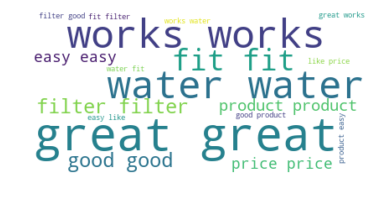

In [37]:
from wordcloud import WordCloud
wordcloud = WordCloud(background_color="white").generate(s)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()